# TP8: Digital Elevation Models

The objective of this lesson is to study the creation and processing of 3D
models computed from satellite images.  The extraction of 3D points from
image correspondences is called *triangulation*.  The processing of generic
3D point clouds is a very general problem, out of the scope of the present
course.  Here, we will content ourselves with the much simpler 2.5D models
that, in the context of geographic imaging, are called *digital elevation
models* (D.E.M.).

We cover the following topics:
* How to find the vertical direction of an image
* How to obtain a 3D point from a match between two images
* How the precision of the point varies according to the baseline
* Computation of a dense point cloud
* Computation of a D.E.M. from a point cloud
* Visualization, ~~filtering, interpolation, registration~~ and fusion of D.E.M.


#### Instructions
To solve this TP, answer the questions below. Then, clear all the output cells using the menu option **Cell->All Output->Clear** and export the notebook with your answers using  the menu option **File->Download as->Notebook**. Send the resulting *.ipynb* file by email to [enric.meinhardt@cmla.ens-cachan.fr](mailto:enric.meinhardt@cmla.ens-cachan.fr) with subject "Report TP8 of Name SURNAME", by today (7-3-2019). You will receive an acknowledgement of receipt.

There are **2 Questions** in the notebook and corresponding code cells to fill-in with your answers.  There are also a few **Exercices** whose solution is already given, but should be understood.

<!--
## Overview of notations

$(x,y)$, $(i,j)$ pixel coordinates in the domain of an image

$(\lambda,\theta,h)$ latitude, longitude, height of a 3D point

$(e,n,h)$ easting, northing, height of a 3D point (the UTM zone is implicit)

$A, B, \ldots$ gray-level images

$A(x,y)$ pixel value at coordinates $(x,y)$ of image $A$

$P_A(\lambda,\theta,h), L_A(x,y,h)$ projection and localization functions
of image $A$

$u, v, \ldots$ raster images representing digital elevation models in
meters

$u(i,j)$ value of $u$ at the pixel $(i,j)$

$u(e,n)$ height of the point at geographic coordinates $(e,n)$

$u(\lambda,\theta)$ height of the point at geographic coordinates
$(\lambda,\theta)$
-->

In [1]:
# setup the notebook environement
%load_ext autoreload
%autoreload 2
%matplotlib notebook

# general imports
import numpy as np                   # numeric linear algebra
from scipy import ndimage            # only for ndimage.affine_transform
import matplotlib.pyplot as plt      # plotting

# imports specific to this course
import utils          # IO and conversion tools (from TP1)
import vistools       # display tools (from TP1)
import rectification  # rectification tools (from TP2)
import stereo         # stereo matching tools (from TP4)

# display hacks
np.set_printoptions(linewidth=80)

## The Tokyo dataset

For this session we use the Tokyo series of 23 Pléiades images, acquired
during a single orbit.  Notice that the satellite has to rotate very fast
and very accurately to point the camera towards the city as it flies all over
it in a few seconds.

In [2]:
# list the tiff images available in the remote folder
#myimages = utils.find('http://138.231.80.166:2332/tokyo/20130103/', 'TIF')  # TODO: copy the images to menthe
myimages = utils.find('http://boucantrin.ovh.hw.ipol.im:9861/20130103/', 'TIF')
print(f"Found {len(myimages)} images")
myimages[0:4]

Found 46 images


['http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137454_PHR1B_MS/IMG_PHR1B_MS_201301030137454_SEN_IPU_20141022_6527-004_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137454_PHR1B_P/IMG_PHR1B_P_201301030137454_SEN_IPU_20141022_6527-003_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137571_PHR1B_MS/IMG_PHR1B_MS_201301030137571_SEN_IPU_20141022_6532-004_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137571_PHR1B_P/IMG_PHR1B_P_201301030137571_SEN_IPU_20141022_6532-003_R1C1.JP2.TIF']

In [3]:
# keep only the panchromatic (P) images, discard the multispectral (MS)
myimages = [x for x in myimages if "_P_" in x]
myimages[0:4]

['http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137454_PHR1B_P/IMG_PHR1B_P_201301030137454_SEN_IPU_20141022_6527-003_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0137571_PHR1B_P/IMG_PHR1B_P_201301030137571_SEN_IPU_20141022_6532-003_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0138084_PHR1B_P/IMG_PHR1B_P_201301030138084_SEN_IPU_20141022_6544-003_R1C1.JP2.TIF',
 'http://boucantrin.ovh.hw.ipol.im:9861/20130103/0138195_PHR1B_P/IMG_PHR1B_P_201301030138195_SEN_IPU_20141022_6554-003_R1C1.JP2.TIF']

In the exercices below we propose to use a fixed area of interest around the Skytree tower.  Optionally, you can select a different scene of your choice, using the `clickablemap` function from TP1.

In [4]:
# create a map widget
m = vistools.clickablemap(zoom=10)

# display the footprint polygons of each image on this map
for f in myimages:
    footprint = utils.lon_lat_image_footprint(f)
    m.add_GeoJSON(footprint)

# center the map on the center of the last footprint
m.center = np.mean(footprint['coordinates'][0], axis=0).tolist()[::-1]
display(m)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

## Finding the vertical direction

The first question is just for *warming up* using the RPC and image extraction
functions from the previous TPs.

**Question 1.** Implement the 'crop_vertical' function.  This function
should extract the requested *Area of interest* (AOI) from an image and rotate it so that the vertical direction in space points upwards in the rotated image domain.  You
can compute the vertical direction by evaluating the RPC functions on 2
points at different heights.  The structure of this function is already given, you only need to complete the 'find_vertical_direction' function.

Apply your function to an area around Skytree Tower (coordinates $35.710139, 139.810833$) or Tokyo Tower (coordinates $35.658611, 139.745556$) to verify that the building is indeed vertical.

In [5]:
# coordinates around Sky Tree's base (the second tallest building in the world)
aoi_skytree = {'type': "Polygon", 'coordinates': [[
    [139.808, 35.7119],
    [139.807, 35.7078],
    [139.815, 35.7078],
    [139.815, 35.7123],
    [139.808, 35.7119] 
]]
}

In [6]:
# crop the region of interest on the first image
crop, offset_x, offset_y = utils.crop_aoi(myimages[0], aoi_skytree)
rpc = utils.rpc_from_geotiff(myimages[0])

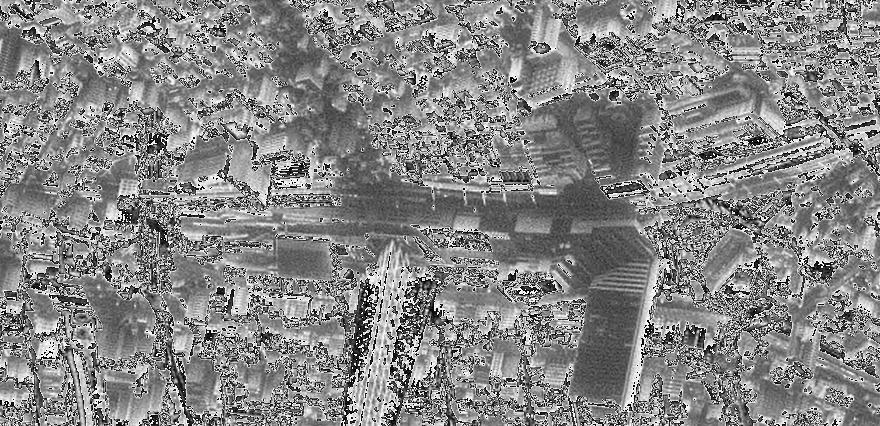

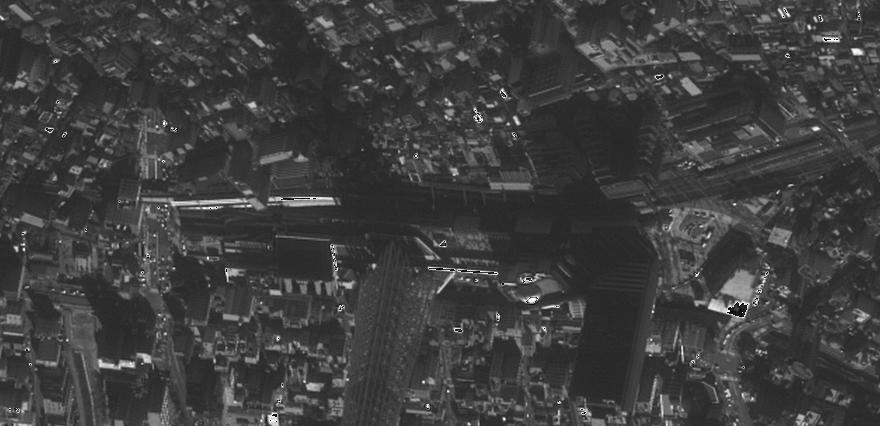

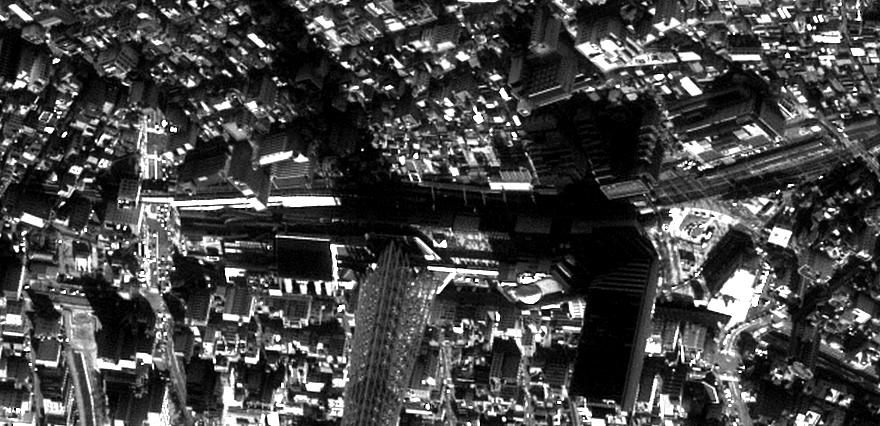

In [7]:
# display the obtained crop
# Notice that the image is not well oriented and is difficult to interpret
vistools.display_image(crop)
vistools.display_image(crop/8)
vistools.display_image(utils.simple_equalization_8bit(crop))

In [127]:
# code for Question 1
def find_vertical_direction(rpc):
    """
    Return the vertical direction associated to an image
    
    Arguments:
        rpc: RPC function of the image
        
    Return:
        p,q : the vertical direction in the image domain (a normalized 2D vector)
    """
    
    # QUESTION 1 : WRITE THE CODE FOR THIS FUNCTION
    
    # find a latitude and longitude coordinate in the image
    lon, lat = rpc.localization(0,0,0)
    # find the pixel coordinates from points at that horizontal location with different heights 
    i1,j1 = rpc.projection(lon, lat, 0)
    i2,j2 = rpc.projection(lon, lat, 0.01)
    # report the vector between the points in the image domain
    dcol = i2-i1 # the x direction increases normally
    drow = j1-j2 # the y direction difference needs to be inverted as the image origin is at the top-left
    vec = np.array([drow, dcol])
    norm = np.sqrt(np.sum(np.power(vec,2)))
    return (1.0/norm)*vec
    

# build a rotation matrix that sets the 3D vertical direction upwards
def build_verticalizing_rotation(rpc, shape):
    p, q = find_vertical_direction(rpc)                   # cosine and sine
    x, y = shape[1]/2, shape[0]/2                         # center of rotation (middle of the image domain)
    T = np.array([[ 1,  0, -x], [0,  1, -y], [0, 0, 1]])  # translate (x,y) to the origin
    R = np.array([[ p, q,  0], [-q,  p,  0], [0, 0, 1]])  # rotate by the requested angle
    R = np.linalg.inv(T) @ R @ T                          # full rotation matrix
    return R

# like crop_aoi, but rotates the image after cropping
def crop_vertical(image, aoi, base_h=0):
    rpc   = utils.rpc_from_geotiff(image)
    a,_,_ = utils.crop_aoi(image, aoi, base_h)
    R     = build_verticalizing_rotation(rpc, a.shape)
    Ra    = ndimage.affine_transform(a.T, np.linalg.inv(R)).T
    return Ra


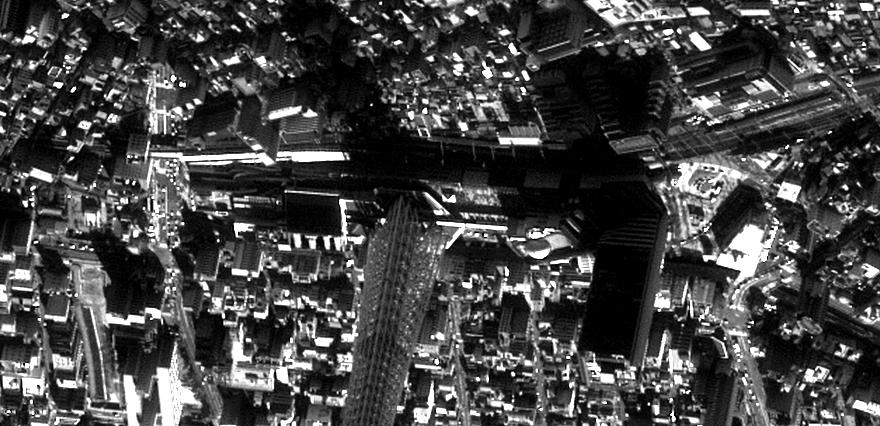
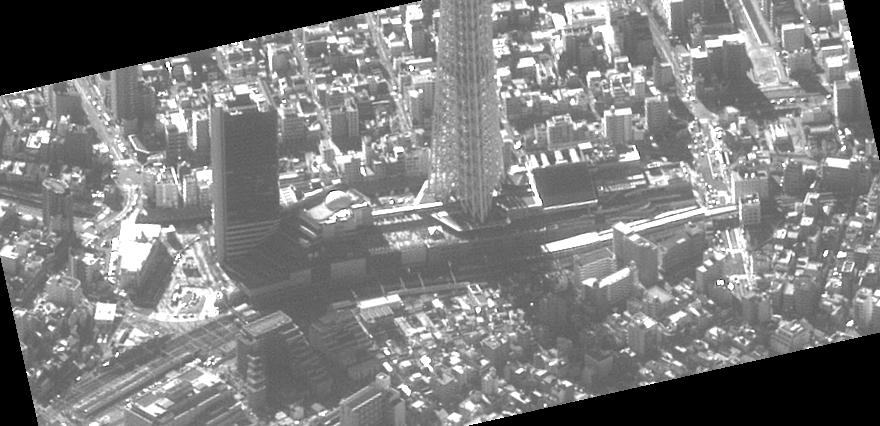

In [89]:
# compare the crop of an image with and without the verticalizing rotation
base_h = 45
a,_,_ = utils.crop_aoi(myimages[0], aoi_skytree, base_h)
b    = crop_vertical(myimages[0], aoi_skytree, base_h)

qa = utils.simple_equalization_8bit(a)
qb = utils.simple_equalization_8bit(b)
vistools.display_gallery([qa, qb])

The following code is used to test your implementation of vertical crop.  You should obtain a timeseries of images such that the vertical direction always points upwards.  **Note:** to evaluate your answer to Question 1 we will run the code below and check visually if the sequence of vertical crops is, indeed, vertical.

In [90]:
# auxiliary function with the same interface as crop_vertical
def crop_rectangular(image, aoi, base_h=0):
    a,_,_ = utils.crop_aoi(image, aoi, base_h)
    return a

In [91]:
# build a timeseries of crops (without rotation)
crops = [ crop_rectangular(x, aoi_skytree, base_h) for x in myimages ]

In [92]:
# build a timeseries of crops (rotated in the vertical direction)
vcrops = [ crop_vertical(x, aoi_skytree, base_h) for x in myimages]

In [93]:
# quantize the crops to 8 bits
q_crops  = [ utils.simple_equalization_8bit(x) for x in crops]
q_vcrops = [ utils.simple_equalization_8bit(x) for x in vcrops]


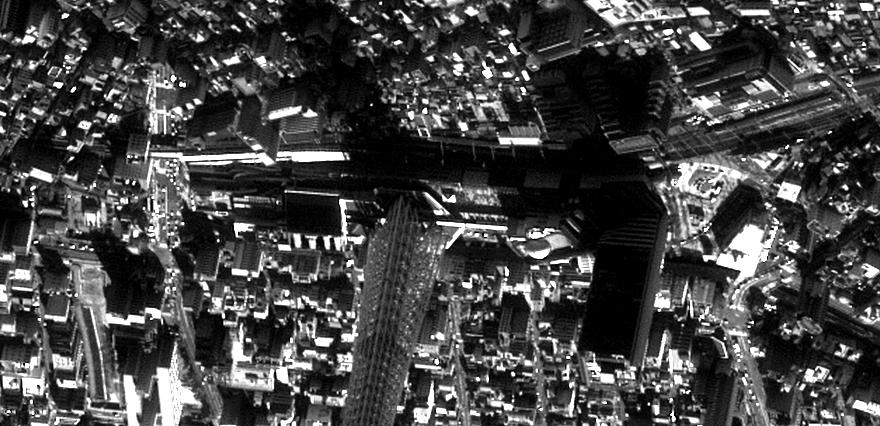
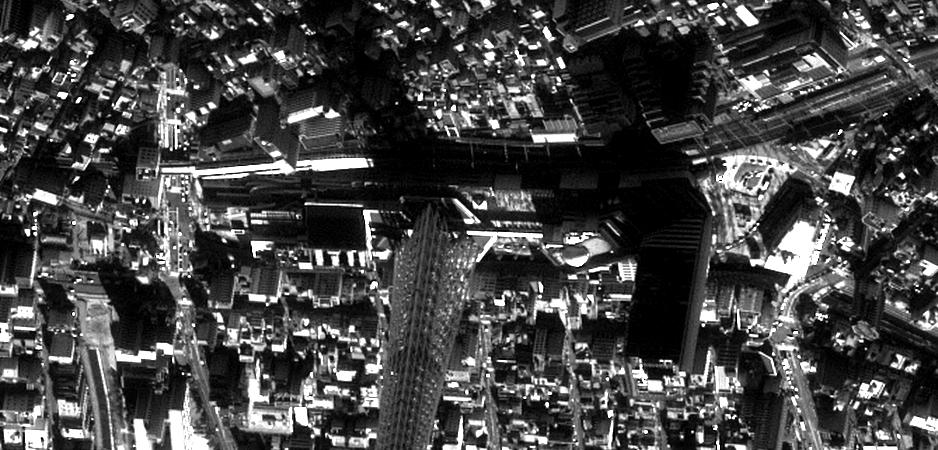
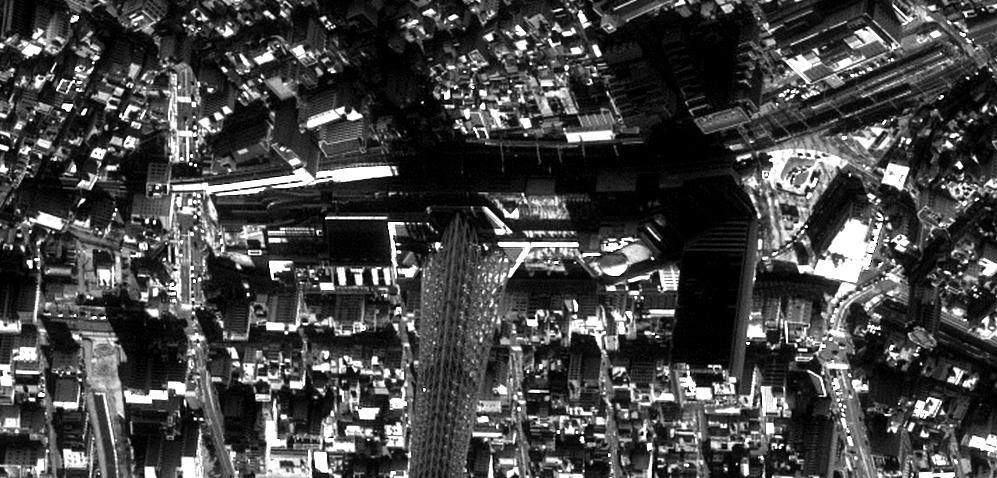
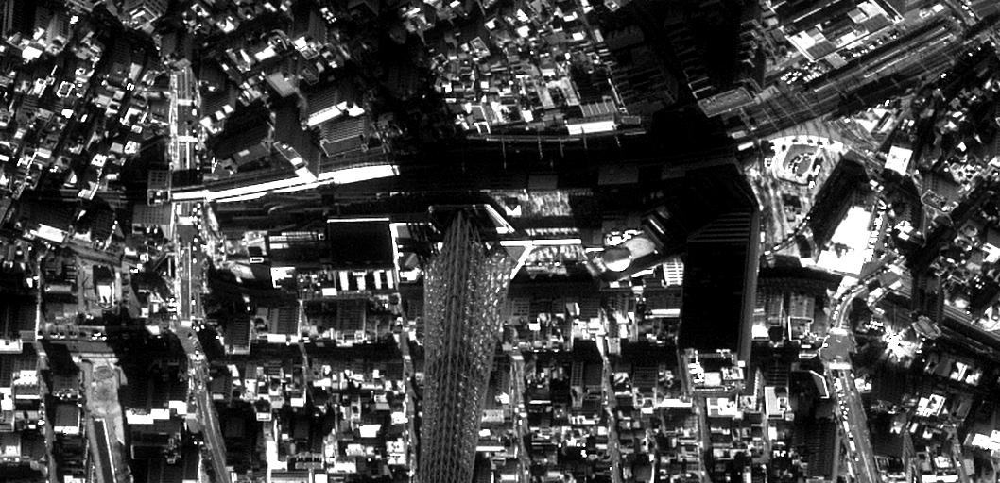
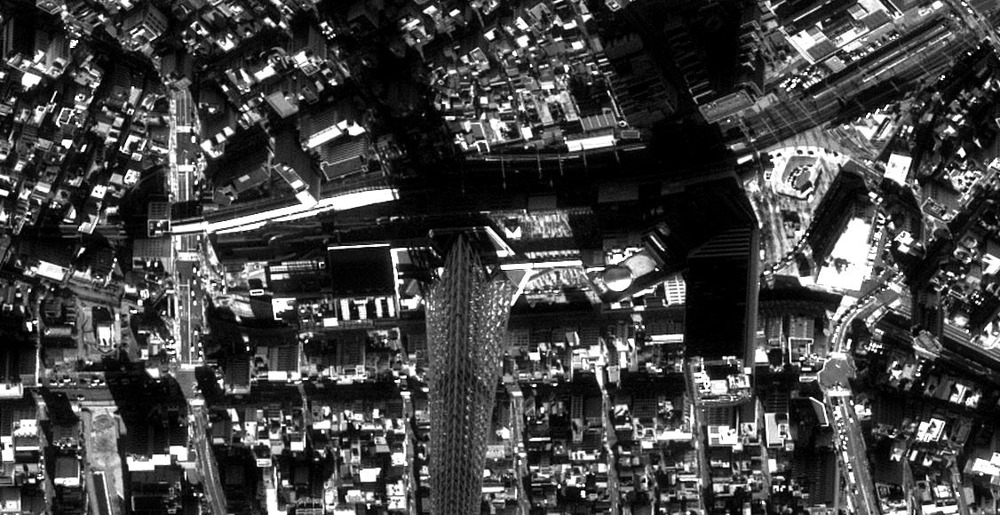
...
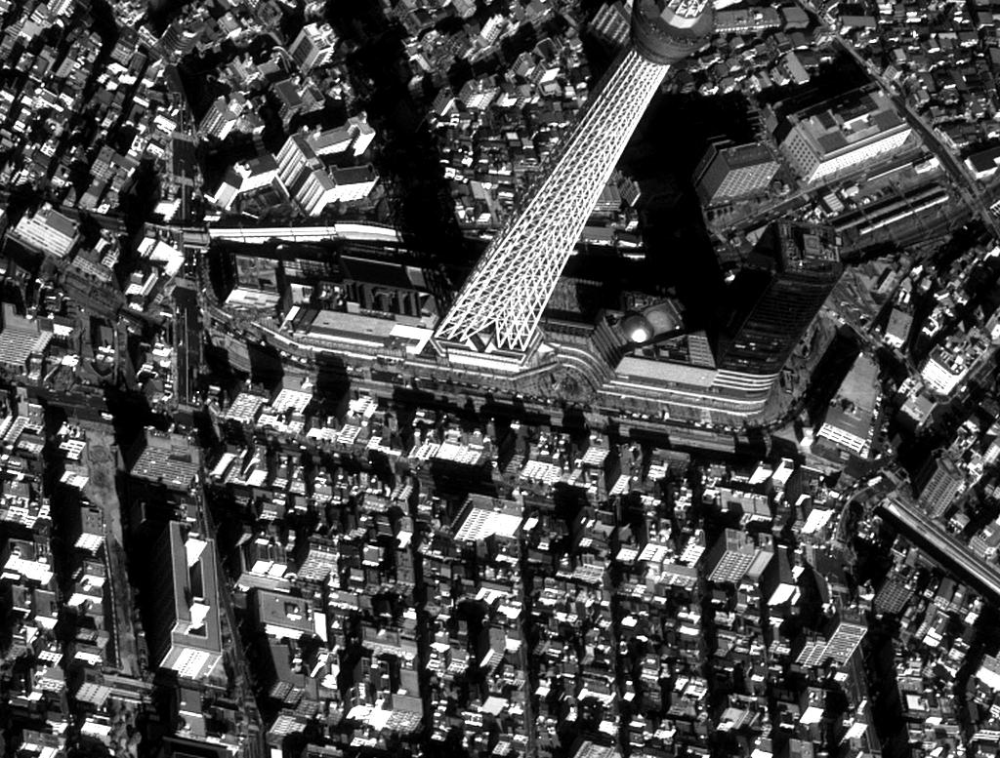
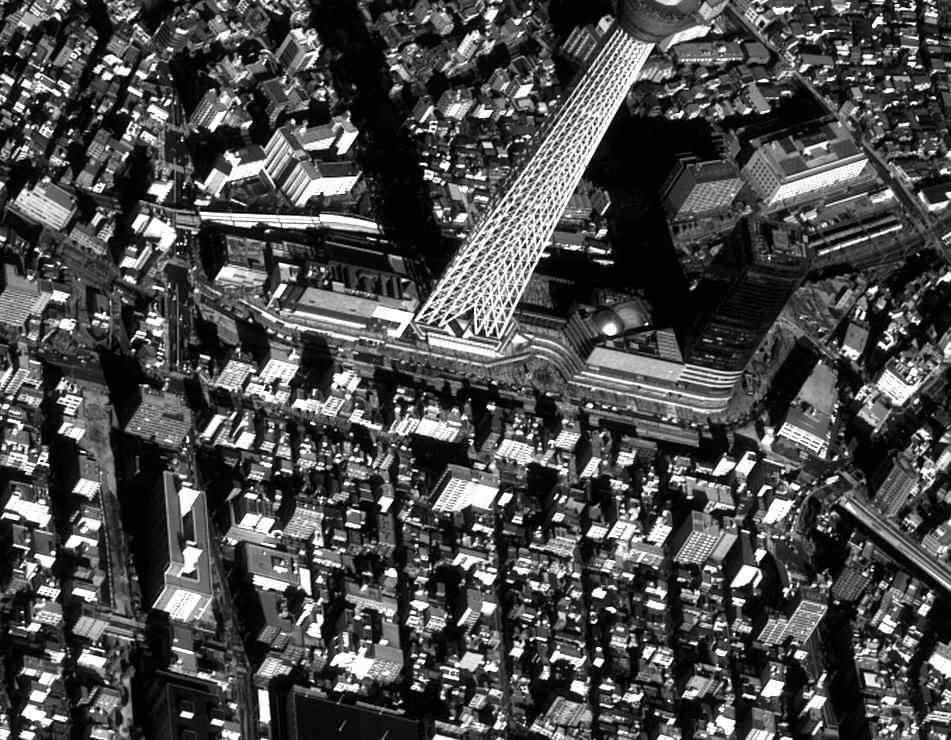
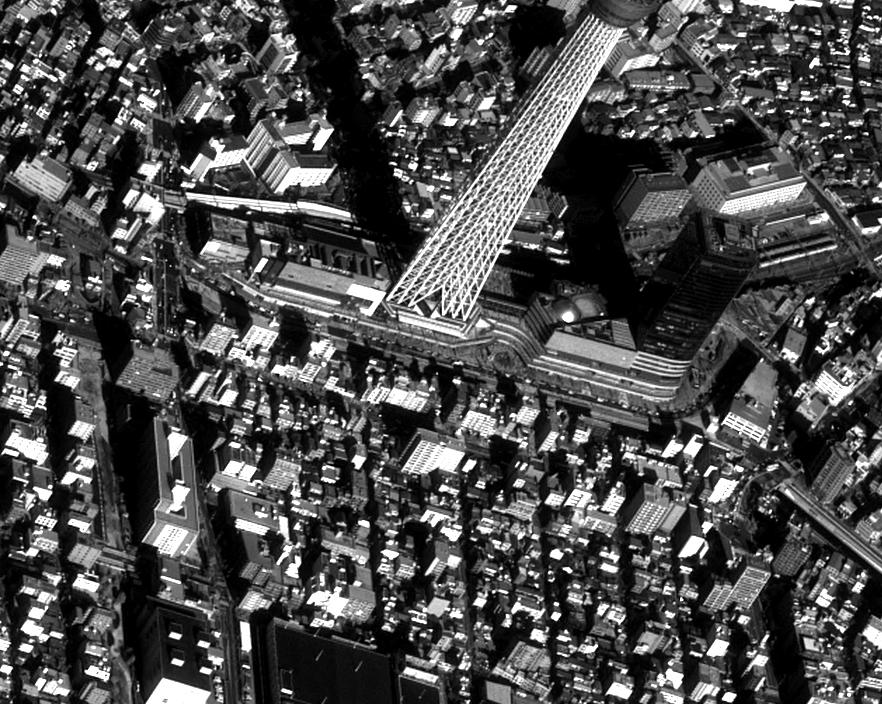
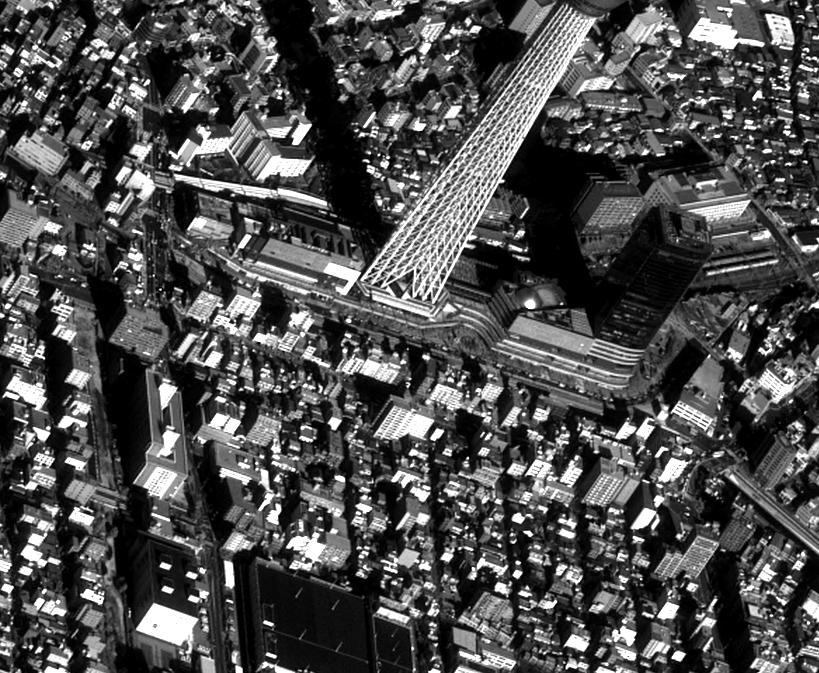
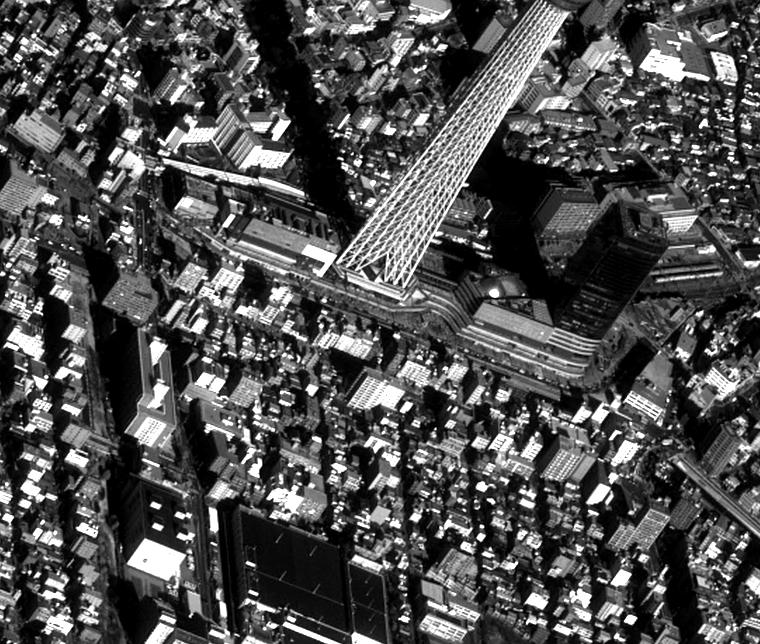

In [94]:
# display the original images
vistools.display_gallery(q_crops)


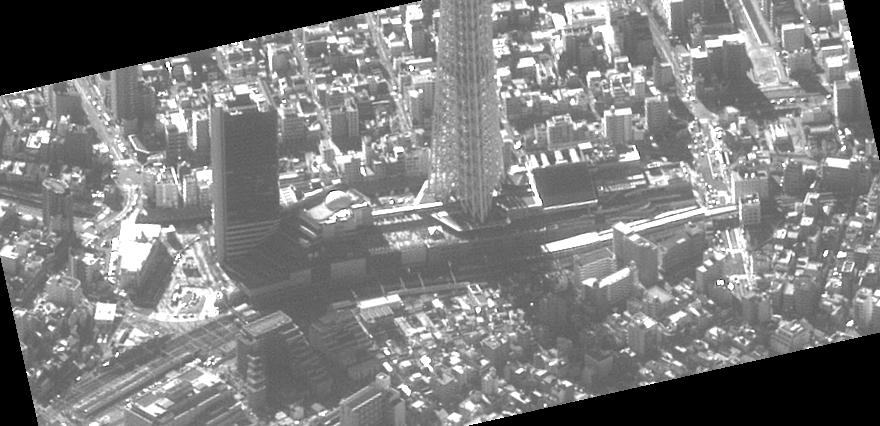
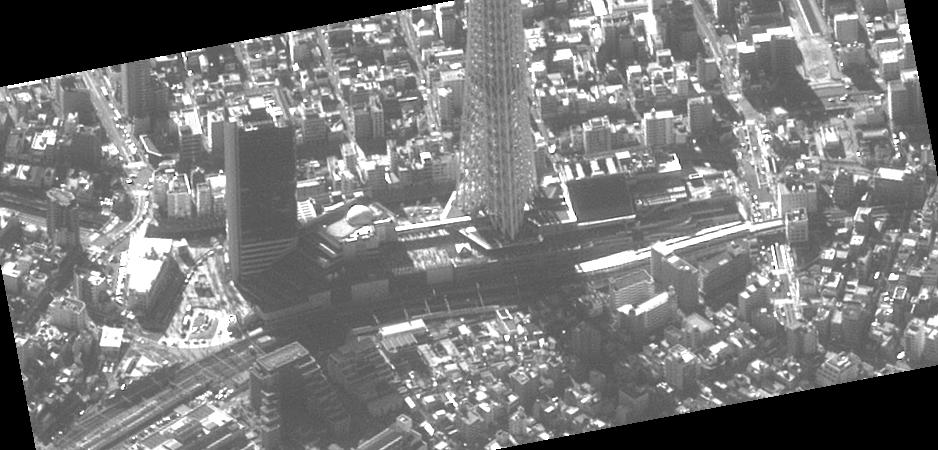
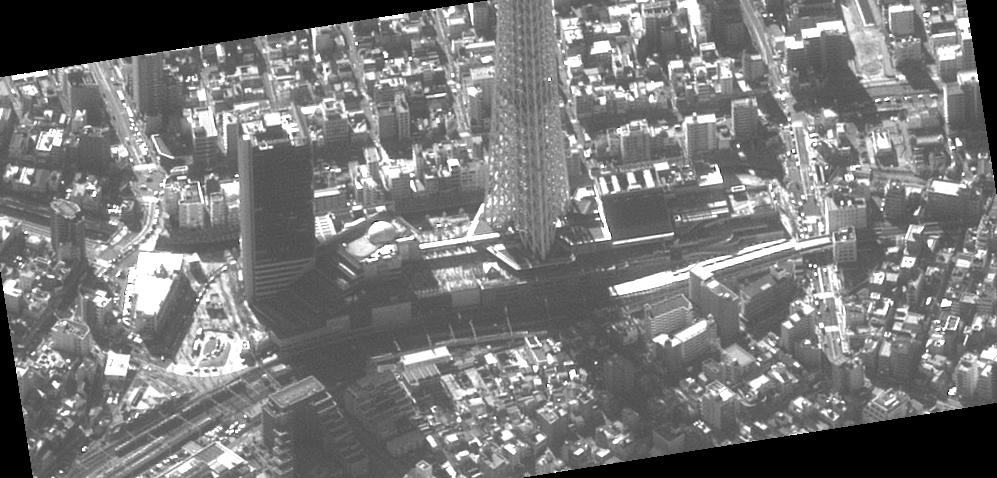
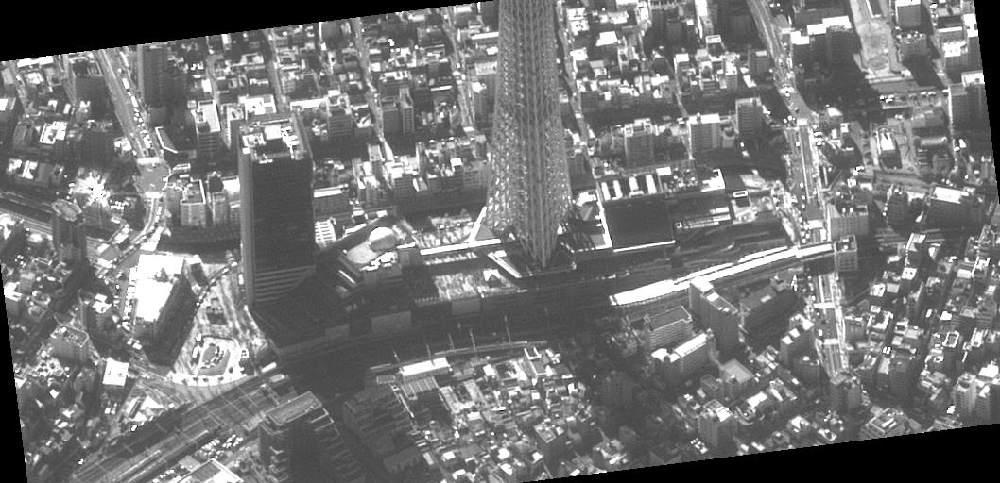
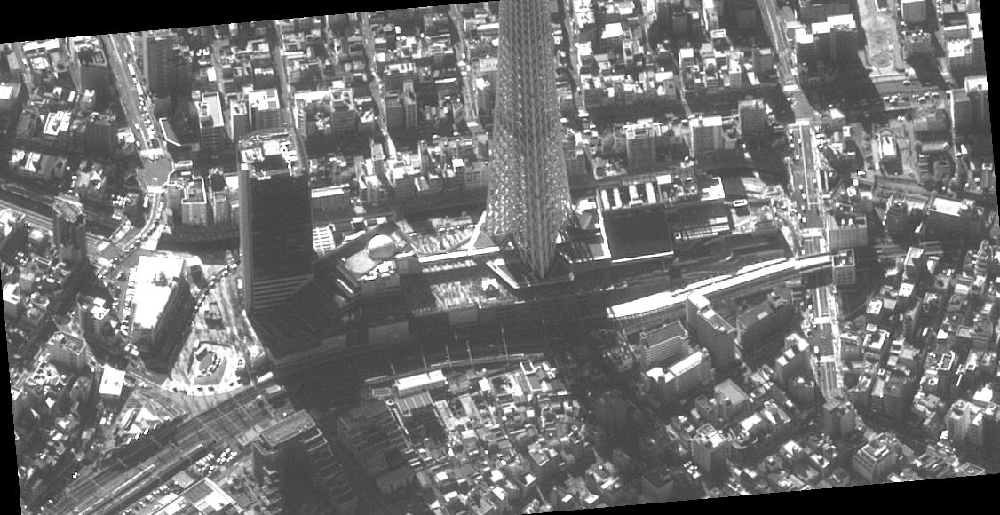
...
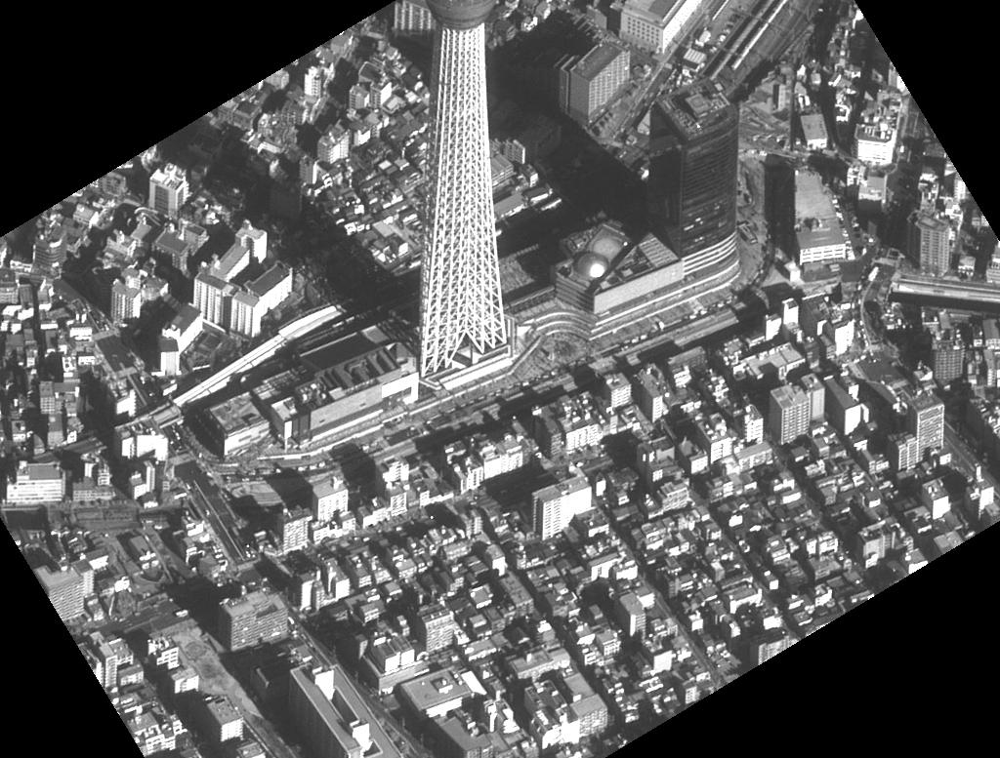
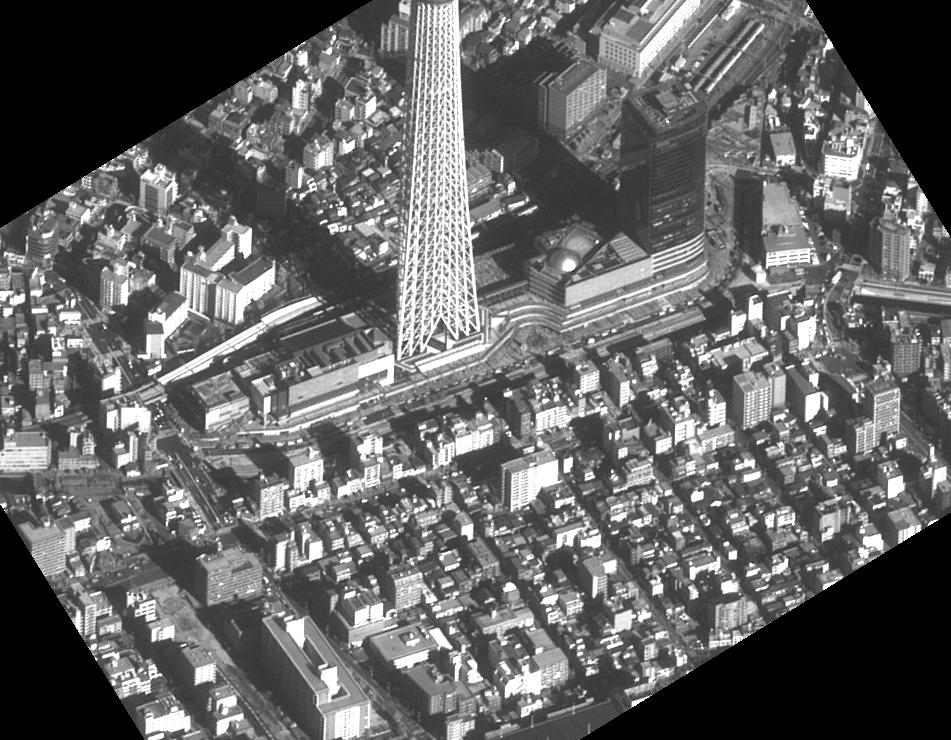
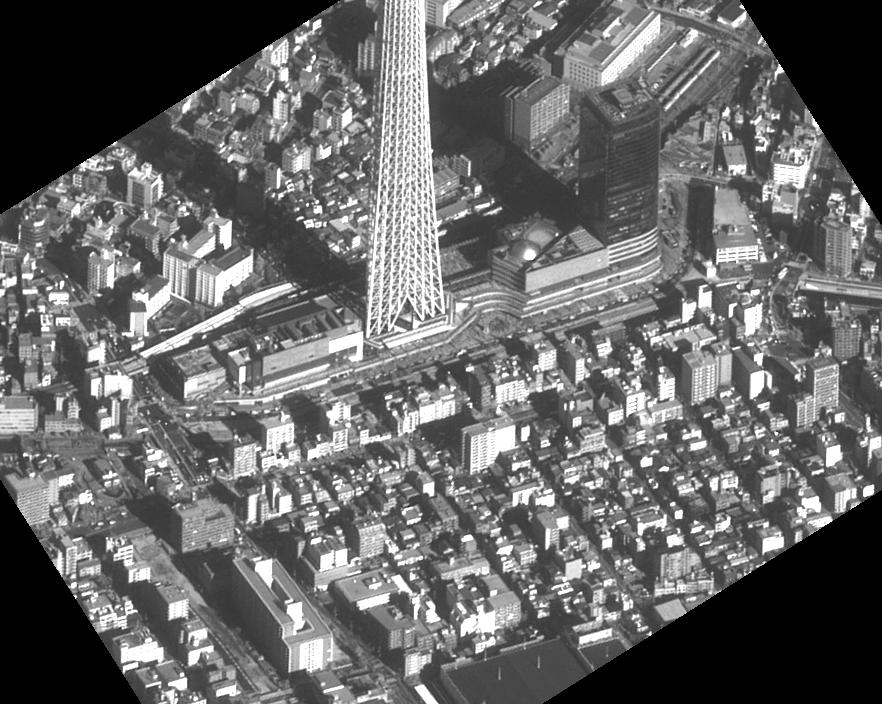
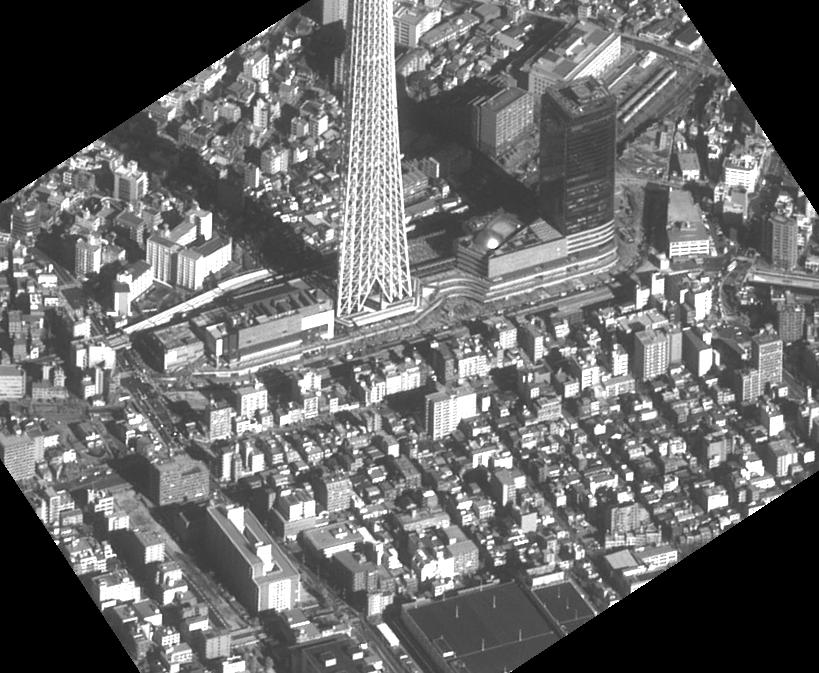
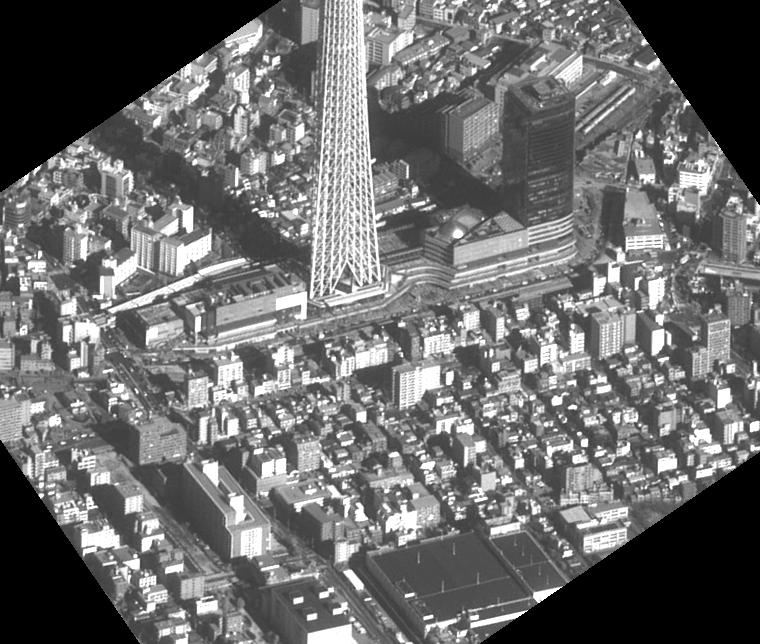

In [95]:
# display the rotated images
vistools.display_gallery(q_vcrops)

## Triangulation of a point

Triangulation consists in finding the position of a 3D point from its projection into two images.  It is also called *intersection* because it can be interpreted as the intersection of two rays in space.  If $x$ is a point in the domain of image $A$ and $x'$ is a point in the domain of image $A'$, the intersection is found by solving the following equation for $h$ : $L_A(x,h)=L_{A'}(x',h)$.  Then, the 3D point of intersection is either $L_A(x,h)$ or $L_{A'}(x',h)$.  This is a system of two equations with a single unknown $h$, so in general it will not have a solution.  In that case, we can define the "solution" by the value of $h$ that minimizes, for example, the error $e(h)=\|L_A(x,h)-L_{A'}(x',h)\|$.  Then, we obtain the 3D point by evaluating the localization function $L_A$.  Thus, the solution is a 3D point that, when projected into image $A$, it falls exactly on $x$, but when projected on image $A'$ it may be a bit far from $x'$.

**Exercise 2** Implement the `triangulation` function that finds the position of a 3D point given a correspondence between two images.  This function should be reasonably fast, because you will want to apply it to all the pixels of an image to obtain a dense 3D cloud.  We give you a slow, naive implementation based on iterative minimization of the error. You should write a fast implementation based on the affine approximation of the RPC functions developed for TP4. Notice that in this case the triangulation function has a closed, linear form.  Verify that your implementation gives the same results as triangulation_iterative (up to a few centimeters).

In [96]:
# evaluate the epipolar line between two images at a value of h
def epipolar_correspondence(rpc_A, rpc_B, x, y, h):
    lon, lat = rpc_A.localization(x, y, h)
    return rpc_B.projection(lon, lat, h)

In [97]:
# slowish implementation of the triangulation, based on iterative approximation
def triangulation_iterative(rpc1, rpc2, x1, y1, x2, y2):
    """
    Triangulate a match between to images
    
    Arguments:
        rpc1, rpc2 : calibration data for each image
        x1, y1 : pixel coordinates in the domain of the first image
        x2, y2 : pixel coordinates in the domain of the second image
        
    Return value: a 4-tuple (lon,lat,h,e)
        lon, lat, h, e : coordinates of the triangulated point, reprojection error
    """
    
    # initial guess for h
    h = rpc1.alt_offset
    hstep = 1
    err = 0
    
    # iteratively improve h to minimize the error
    for i in range(10):
        # two points on the epipolar curve of (x1, y1)
        # are used to approximate it by a straight line
        px, py = epipolar_correspondence(rpc1, rpc2, x1, y1, h)
        qx, qy = epipolar_correspondence(rpc1, rpc2, x1, y1, h + hstep)
        
        # displacement vectors between these two points and with the target
        ax, ay = qx-px, qy-py
        bx, by = x2-px, y2-py
        
        # projection of the target into the straight line
        l = (ax*bx + ay*by) / (ax*ax + ay*ay)   
        rx, ry = px+l*ax, py+l*ay
        
        # error of this projection
        err = np.hypot(rx - x2, ry - y2)
        
        # new value for h
        h = h + l * hstep
        
        # stop if l becomes too small (max 2 or 3 iterations are performed in practice)
        if np.all(np.fabs(l) < 1e-3):
            break
    
    lon, lat = rpc1.localization(x1, y1, h)
    return lon, lat, h, err

In [98]:
# invert the affine map represented by a 2x4 matrix
def invert_affine_map(A):
    X = np.vstack([A , [0,0,1,0] ])
    B = np.linalg.inv(X)
    return B[0:3]
                   

# code for exercice 2
def triangulation_affine(PA, PB, x1, y1, x2, y2):
    """
    Triangulate a (list of) match(es) between two images of affine cameras.

    Arguments:
        PA, PB : affine (projection) camera matrices of the two images
        x1, y1 : pixel coordinates in the domain of the first image
        x2, y2 : pixel coordinates in the domain of the second image

    Return value: a 4-tuple (lon, lat, h, e)
        lon, lat, h, e : coordinates of the triangulated point(s), reprojection error
    """
    
    # build projection and localization matrices as 4x4 homogeneous (x,y,h,1) <-> (lon,lat,h,1)
    PA = np.vstack([ PA[0:2], [0,0,1,0], [0,0,0,1]])  # pick only first two rows
    PB = np.vstack([ PB[0:2], [0,0,1,0], [0,0,0,1]])  # pick only first two rows
    LA = np.linalg.inv(PA)  # inverse of a 4x4 matrix
    
    # affine epipolar correspondence
    E = PB @ LA
    
    # Now, the linear system E * (x1, y1, h, 1) = (x2, y2, h, 1)
    # has two different equations and one unknown h.  We solve it by 
    # least squares (a simple projection, in this case).
    
    # give names to the 8 non-trivial coefficients of E
    a, b, p, r = E[0]
    c, d, q, s = E[1]
    
    # coefficients of the affine triangulation
    # (obtained by solving manually the normal equation)
    f = [-p*a - q*c, -p*b - q*d, p, q, -p*r - q*s ] / (p*p + q*q)
    
    # apply the triangulation (first use of the input points)
    h = f[0]*x1 + f[1]*y1 + f[2]*x2 + f[3]*y2 + f[4]
    
    # finish the computation and return the 4 required numbers (or vectors)
    lon = LA[0,0] * x1 + LA[0,1] * y1 + LA[0,2] * h + LA[0,3]
    lat = LA[1,0] * x1 + LA[1,1] * y1 + LA[1,2] * h + LA[1,3]
    ex = E[0,0] * x1 + E[0,1] * y1 + E[0,2] * h + E[0,3] - x2
    ey = E[1,0] * x1 + E[1,1] * y1 + E[1,2] * h + E[1,3] - y2
    e = ex * ex + ey * ey
    return lon, lat, h, e

# compute the affine approximations and triangulate a list of points
def triangulation_affine_rpc(rpc1, rpc2, x1, y1, x2, y2, base_lon, base_lat, base_h):
    P_A = rectification.rpc_affine_approximation(rpc1, (base_lon, base_lat, base_h))
    P_B = rectification.rpc_affine_approximation(rpc2, (base_lon, base_lat, base_h))
    return triangulation_affine(P_A, P_B, x1, y1, x2, y2)

Now that we have the triangulation function, we can produce points in 3D space.  Let us compute the height of the Skytree tower.  https://en.wikipedia.org/wiki/Tokyo_Skytree

In [99]:
# extract the rpcs of all images
myrpcs = [ utils.rpc_from_geotiff(x) for x in myimages ]

In [100]:
myrpcs[3]


    # Projection function coefficients
      col_num = -0.0013  1.0030  0.0000 -0.0004  0.0015  0.0000 -0.0000  0.0012 -0.0003  0.0000  0.0000 -0.0000 -0.0000 -0.0000  0.0000  0.0001  0.0000 -0.0000 -0.0000  0.0000
      col_den =  1.0000  0.0000 -0.0015 -0.0000 -0.0000  0.0000 -0.0000  0.0000  0.0000 -0.0000  0.0000 -0.0000 -0.0000  0.0000  0.0000  0.0000  0.0000  0.0000 -0.0000  0.0000
      row_num =  0.0082  0.1004 -1.1069  0.0071  0.0005 -0.0000  0.0000 -0.0025 -0.0071  0.0000 -0.0000  0.0000  0.0000  0.0000 -0.0001 -0.0003 -0.0001  0.0000  0.0000  0.0000
      row_den =  1.0000 -0.0000  0.0012 -0.0000  0.0000 -0.0000  0.0000  0.0000 -0.0002  0.0001 -0.0000  0.0000  0.0000 -0.0000 -0.0000 -0.0000 -0.0000  0.0000  0.0000 -0.0000

    # Offsets and Scales
      row_offset = 10625.5
      col_offset = 19999.5
      lat_offset = 35.66652931819583
      lon_offset = 139.7498421575681
      alt_offset = 60.0
      row_scale = 10625.5
      col_scale = 19999.5
      lat_scale = 0.104504

In [101]:
# check whether the localization function gives reasonable results
myrpcs[3].localization(1000, 1000, 10)

(139.60606729208916, 35.74284049488068)

In [102]:
# let us work with images 9 and 14
idx_a = 9
idx_b = 14

In [103]:
# extract a crop of each image and SAVE THE CROP OFFSETS FOR LATER
crop_a, offx_a, offy_a = utils.crop_aoi(myimages[idx_a], aoi_skytree)
crop_b, offx_b, offy_b = utils.crop_aoi(myimages[idx_b], aoi_skytree)
print(f"x0_a, y0_a = {offx_a}, {offy_a}")
print(f"x0_b, y0_b = {offx_b}, {offy_b}")

x0_a, y0_a = 30022, 9264
x0_b, y0_b = 29428, 11160



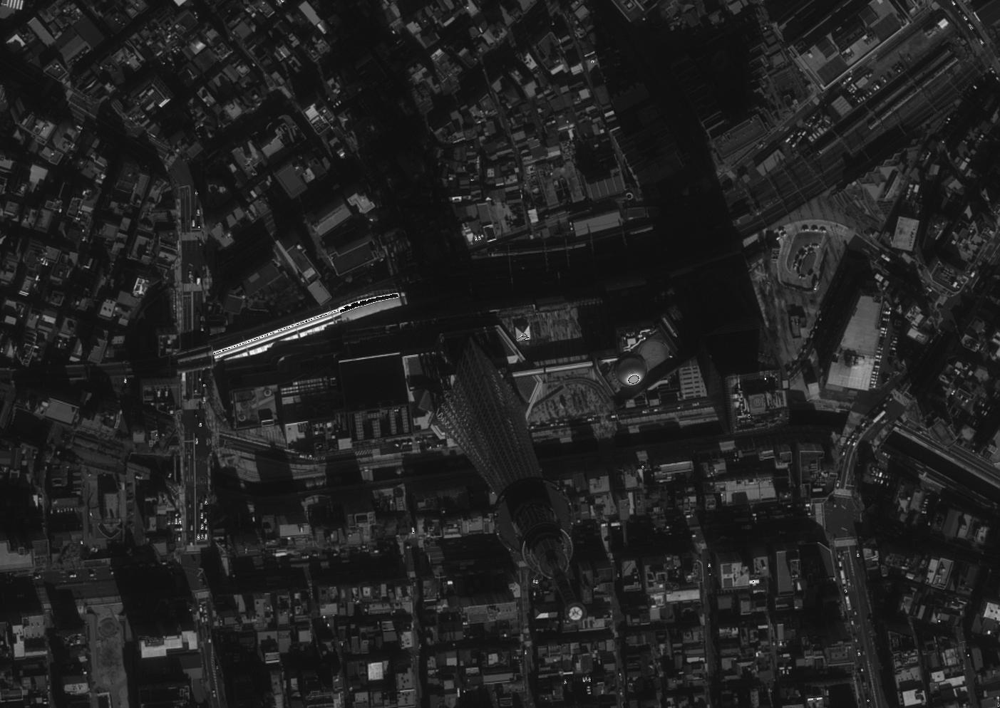
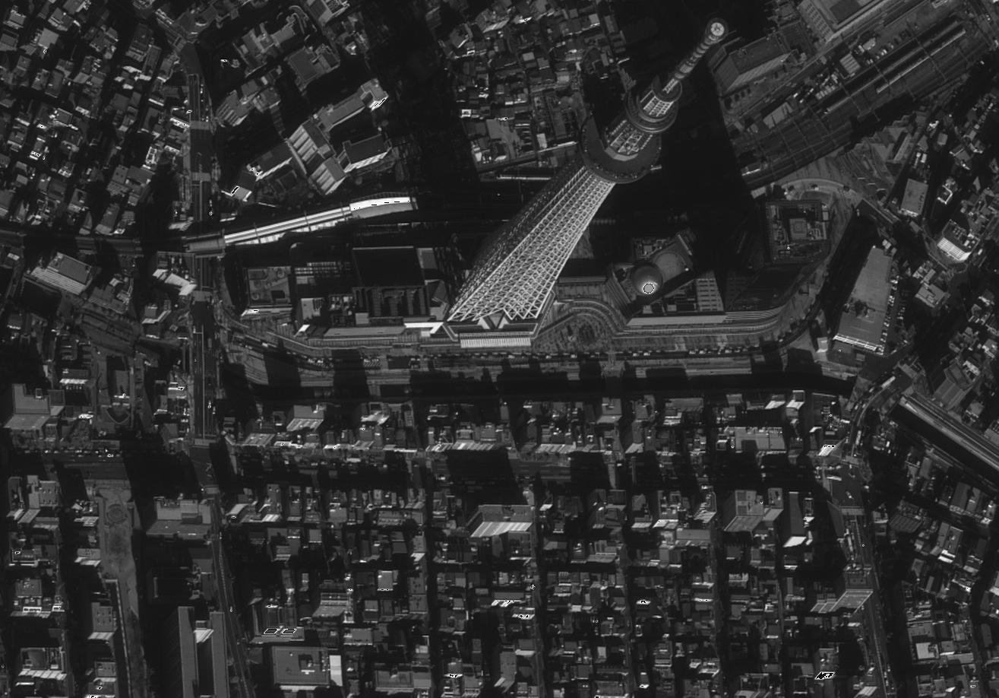

In [104]:
# show the two extracted crops
vistools.display_gallery([crop_a/10,crop_b/10])

<IPython.core.display.Javascript object>


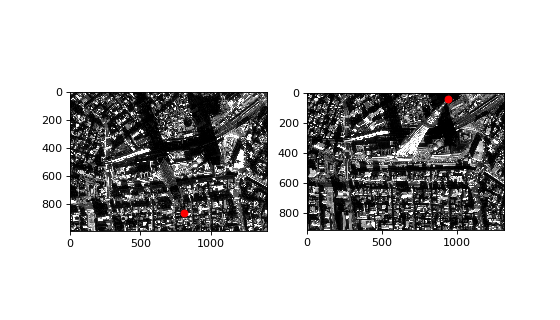

In [105]:
# display the two crops, and a manually selected point
p = [807, 861]
q = [944, 38]
_,f = plt.subplots(1, 2, figsize=(7,4))
f[0].imshow(utils.simple_equalization_8bit(crop_a), cmap="gray")
f[1].imshow(utils.simple_equalization_8bit(crop_b), cmap="gray")
f[0].plot(*p, "ro")
f[1].plot(*q, "ro")

In [106]:
# triangulate this single match to find (longitude, latitude, height, error_in_pixels)
x = triangulation_iterative(myrpcs[idx_a], myrpcs[idx_b],
                            p[0] + offx_a, p[1] + offy_a, q[0] + offx_b, q[1] + offy_b)
x

(139.810726382982, 35.70999360417043, 672.5886128348391, 0.19159315467319912)

In [107]:
%%time
# observe that the iterative triangulation is rather slow
for i in range(100):
    triangulation_iterative(myrpcs[idx_a], myrpcs[idx_b],
                            p[0] + offx_a, p[1] + offy_a, q[0] + offx_b, q[1] + offy_b)

CPU times: user 7.46 s, sys: 0 ns, total: 7.46 s
Wall time: 7.47 s


In [108]:
# choose a base point for the affine approximation
base_of_tower = [x[0], x[1], 40]

In [109]:
# triangulate this match using the affine approximation
triangulation_affine_rpc(myrpcs[idx_a], myrpcs[idx_b],
                         p[0] + offx_a, p[1] + offy_a, q[0] + offx_b, q[1] + offy_b,
                         *base_of_tower)

(139.81072764263166, 35.70999369993552, 672.5778941907247, 0.03220838967040473)

**Observation:** Notice that the exact and the affine projection models give essentially the same 3D point.  The affine approximation turns out to be much faster.  In the following, we will study the precision of the affine approximation.

## Triangulation of a track

The following array contains the image coordinates at the top of the Skytree tower (carefully picked by hand), for each of the 23 images in the series.  The Skytree tower has a height of $634m$ above the ground, which at this location is $45m$ above the surface of the WGS84 ellipsoid.

In [110]:
# position of the top of the antenna, selected by hand using an interactive image viewer
top_of_skytree = np.array([
    [26542, 6688 ], [27004, 6733 ], [27472, 6792 ], [27959, 6898 ], [28484, 7609 ],
    [29012, 8122 ], [29524, 8501 ], [30045, 9211 ], [30501, 9782 ], [30829, 10125],
    [31043, 10296], [31094, 10321], [31001, 10448], [30751, 10933], [30372, 11198],
    [29902, 11236], [29377, 11445], [28828, 11390], [28297, 11096], [27581, 10991],
    [27072, 10838], [26600, 10742], [26157, 10605]
])

**Exercice 3** Fill-in a $23\times23$ matrix (minus the diagonal) with the height of the top of the tower, as computed from all the possible pairs of images.  Display the matrix in color and see if it has a visible pattern.  Display the matrix also for the reprojection errors.

In [111]:
# this function is used to fill the matrix of heights
def top_of_skytree_height_from_pair_exact(i, j):
    if (i == j):
        return 0,0
    else:
        pi = top_of_skytree[i]
        pj = top_of_skytree[j]
        lon, lat, h,e = triangulation_iterative(myrpcs[i], myrpcs[j], *pi, *pj)
        return h,e

In [112]:
def skytree_top_matrices_exact():
    """
    Compute the height of the skytree tower top using all possible pairs of images
    
    Arguments:
        none, use the global variables "top_of_skytree" and "myrpcs"
        
    Return value:
        Mh, Me : matrices of size 23x23 containing the height and the reprojection error for each pair
    """
    
    Mh = np.zeros((23,23))
    Me = np.zeros((23,23))
    for j in range (23):
        for i in range(23):
            h,e = top_of_skytree_height_from_pair_exact(i,j)
            #print((i,j,h))
            Mh[i,j] = h
            Me[i,j] = e
    return Mh,Me

In [113]:
%%time
# build the matrix of heights using the EXACT triangulation    # THIS CAN TAKE UP TO A MINUTE
ex_Mh, ex_Me = skytree_top_matrices_exact()

CPU times: user 1min 6s, sys: 0 ns, total: 1min 6s
Wall time: 1min 6s


<IPython.core.display.Javascript object>


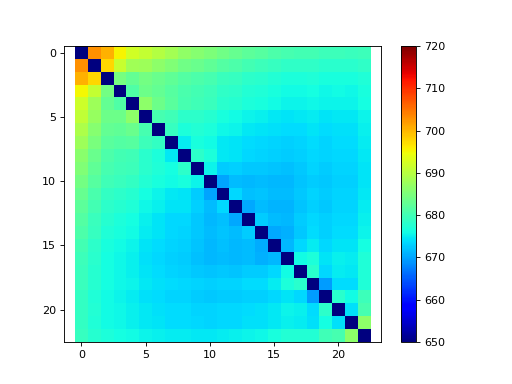

<IPython.core.display.Javascript object>


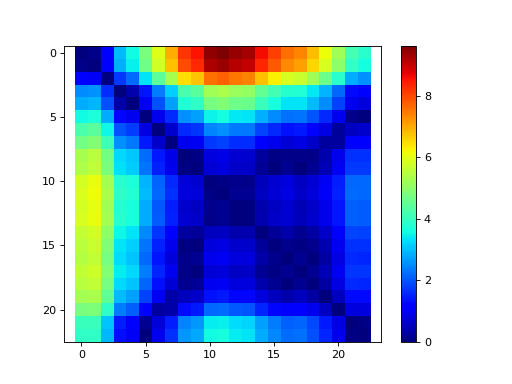

In [114]:
# display the matrices in color to interpret the results
vistools.display_imshow(ex_Mh,[650,720],cmap="jet",)
vistools.display_imshow(ex_Me,cmap="jet")

In [115]:
def skytree_top_matrices_affine():
    """
    Compute the height of the skytree tower top using all possible pairs of images
    
    Arguments:
        none, use the global variables "top_of_skytree" and "myrpcs"
        
    Return value:
        Mh, Me : matrices of size 23x23 containing the height and the reprojection error for each pair
    """
    
    # first compute a base point for the approximations
    p10 = top_of_skytree[10]
    p11 = top_of_skytree[11]
    base_lon, base_lat, base_h, _ = triangulation_iterative(myrpcs[10], myrpcs[11], *p10, *p11)
    
    # we move the base point a bit
    base_lat += 0.005 # about 500m
    base_lon += 0.005
    base_h = 0
    
    # compute approximate projection matrices for each image
    P = [
        rectification.rpc_affine_approximation(myrpcs[i], (base_lon, base_lat, base_h))
        for i in range(23)
    ]
    
    # fill height and error matrices
    Mh = np.zeros((23,23))
    Me = np.zeros((23,23))
    for j in range (23):
        for i in range(23):
            pi = top_of_skytree[i]
            pj = top_of_skytree[j]
            if (i != j):
                _, _, h, e = triangulation_affine(P[i], P[j], *pi, *pj)
                Mh[i,j] = h
                Me[i,j] = e
    return Mh,Me

In [116]:
%%time
# build the matrix of heights using the AFFINE APPROXIMATED triangulation
ar_Mh, ar_Me = skytree_top_matrices_affine()

CPU times: user 580 ms, sys: 144 ms, total: 724 ms
Wall time: 549 ms


<IPython.core.display.Javascript object>


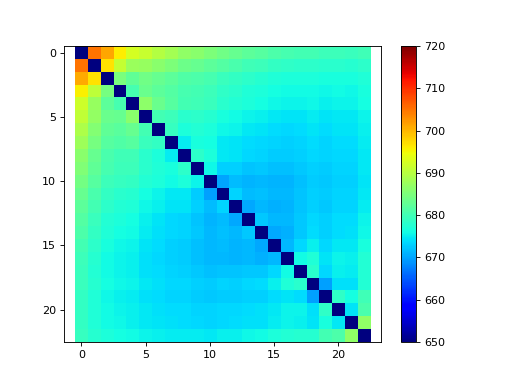

<IPython.core.display.Javascript object>


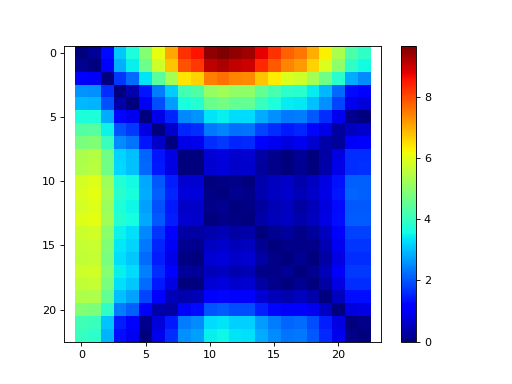

In [117]:
# display the matrices in color to interpret the results
vistools.display_imshow(ar_Mh,[650,720],cmap="jet",)
vistools.display_imshow(np.sqrt(ar_Me),cmap="jet")

<IPython.core.display.Javascript object>


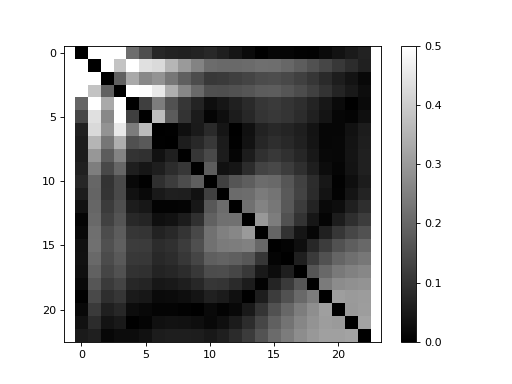

In [118]:
# show the difference between the exact and the approximate heights
vistools.display_imshow(np.fmin(0.5,np.abs(ar_Mh - ex_Mh)))

## Precision of the triangulation depending on the baseline

Notice that the affine triangulation is essentially instantaneous.  This will allow to triangulate a dense set of matches.  But first, we study the stability and precision of the triangulation depending on the pair of images (that have different baselines).

**Exercice 4** Repeat the previous experiment adding gaussian noise of $\sigma=2\mathrm{pixels}$ to the positions of the input points.  The experiment should be run a large number of times (say, one hundred), and the variance of the measure acquired for each image pair must be plotted in matrix form.  Can you identify the pairs of images where the measure is more precise?

In [119]:
def skytree_top_variances():
    """
    Compute the height of the skytree tower top using all possible pairs of images
    
    Arguments:
        none, use the global variables "top_of_skytree" and "myrpcs"
        
    Return value:
        Mvar : Mvar[i,j] = estimated variance of height errors with respect to Mh
    """
    
    n = 100 # number of tests
    sigma = 2 # error in pixels
    
    Mvar = np.zeros((23,23))
    
    # first compute a base point for the approximations
    p10 = top_of_skytree[10]
    p11 = top_of_skytree[11]
    base_lon, base_lat, base_h, _ = triangulation_iterative(myrpcs[10], myrpcs[11], *p10, *p11)
    
    # compute approximate projection matrices for each image
    P = [
        rectification.rpc_affine_approximation(myrpcs[i], (base_lon, base_lat, base_h))
        for i in range(23)
    ]
    
    # add gaussian noise to the points before computing the matrices,
    Mh_all = np.zeros((n,23,23))
    for k in range(n):
        Mh = np.zeros((23,23))
        for j in range (23):
            for i in range(23):
                pi = top_of_skytree[i] + sigma * np.random.randn(2)
                pj = top_of_skytree[j] + sigma * np.random.randn(2)
                if (i != j):
                    _, _, h, _ = triangulation_affine(P[i], P[j], *pi, *pj)
                    Mh[i,j] = h
        Mh_all[k,:,:] = Mh
        
    
    return Mh_all.std(axis=0)

In [120]:
# compute the matrix of variances for each image pair
MM = skytree_top_variances()

<IPython.core.display.Javascript object>


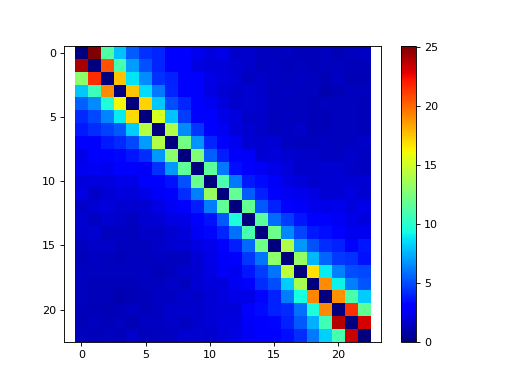

In [121]:
# show the precision matrix in color
vistools.display_imshow(MM, cmap='jet')

## Dense triangulation

Until now, we have been triangulating a *single* point!
To compute a dense 3D point cloud, we will apply the triangulation function to matches computed using the stereo matching algorithms seen on TP4.  For that, we need to rectify the images using the techniques seen on TP2.

In [122]:
# preparation : select two images and an area of interest

# select two central images
idx_a = 11
idx_b = 12

# coordinates around the Meji Memorial Picture Museum (too large, do not use as it will be very slow), or Skytree Tower
aoi_meji = {'type': "Polygon", 'coordinates': [[
#    [139.97, 35.4406],
#    [139.97, 35.4283],
#    [139.986, 35.4283],
#    [139.986, 35.4406],
#    [139.97, 35.4406]
    [139.808, 35.7119],
    [139.807, 35.7078],
    [139.815, 35.7078],
    [139.815, 35.7123],
    [139.808, 35.7119] 
]]
}


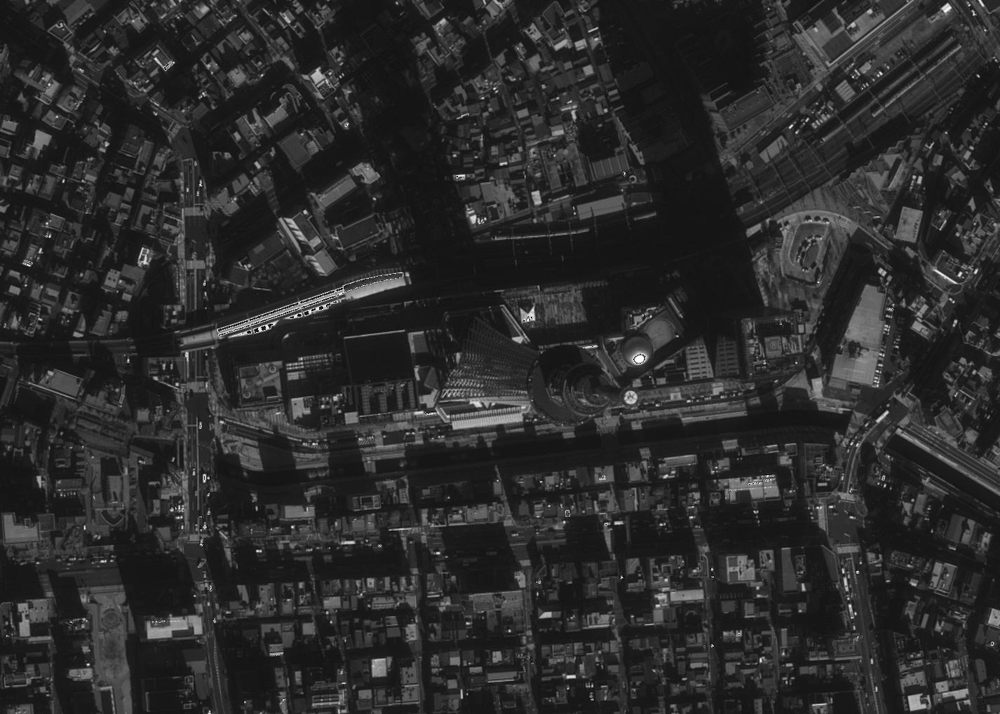
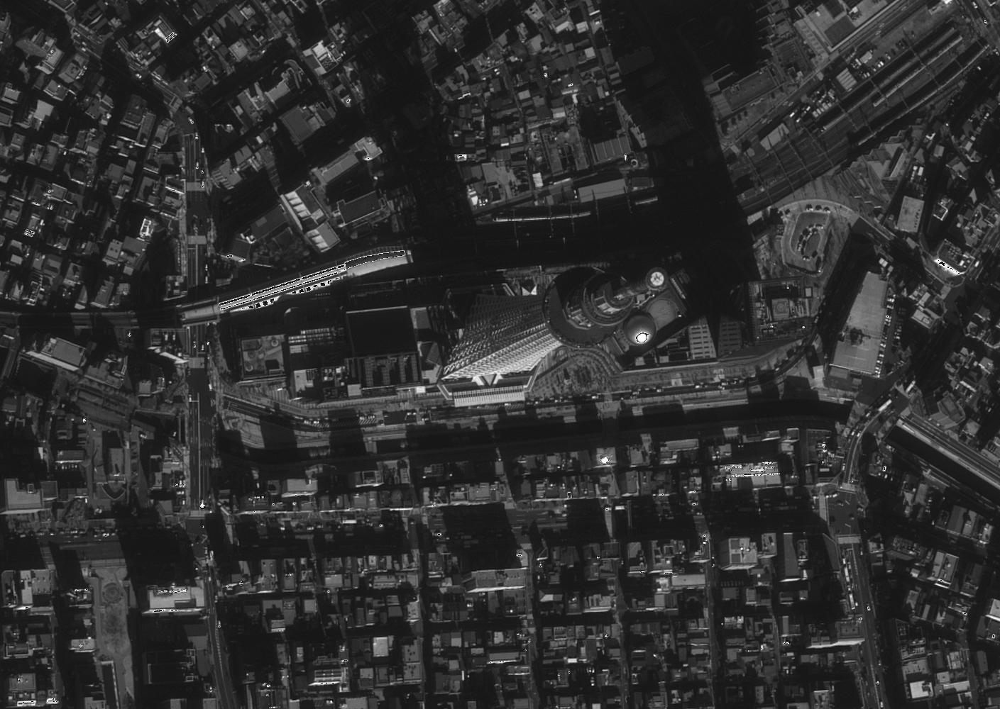

In [123]:
# look at the images before rectification
a, offx_a, offy_a = utils.crop_aoi(myimages[idx_a], aoi_meji)
b, offx_b, offy_b = utils.crop_aoi(myimages[idx_b], aoi_meji)
vistools.display_gallery([a/8,b/8])

In [124]:
# rectify the images using the techniques of TP2
rect1, rect2, S1, S2, dmin, dmax, PA, PB = rectification.rectify_aoi(
                                    myimages[idx_a], myimages[idx_b], aoi_meji)
S1, S2, dmin, dmax

Downloading: /home/student1/.srtm/srtm_64_05.zip Bytes: 18749810


(array([[-2.36033527e-01,  9.67990685e-01, -1.97800000e+03],
        [-9.67990685e-01, -2.36033527e-01,  3.31648641e+04],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 array([[-2.60677946e-01,  9.77383270e-01, -1.60929858e+03],
        [-9.74887079e-01, -2.38601783e-01,  3.33451359e+04],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]),
 -7.480335604329594,
 0.7878772305804886)


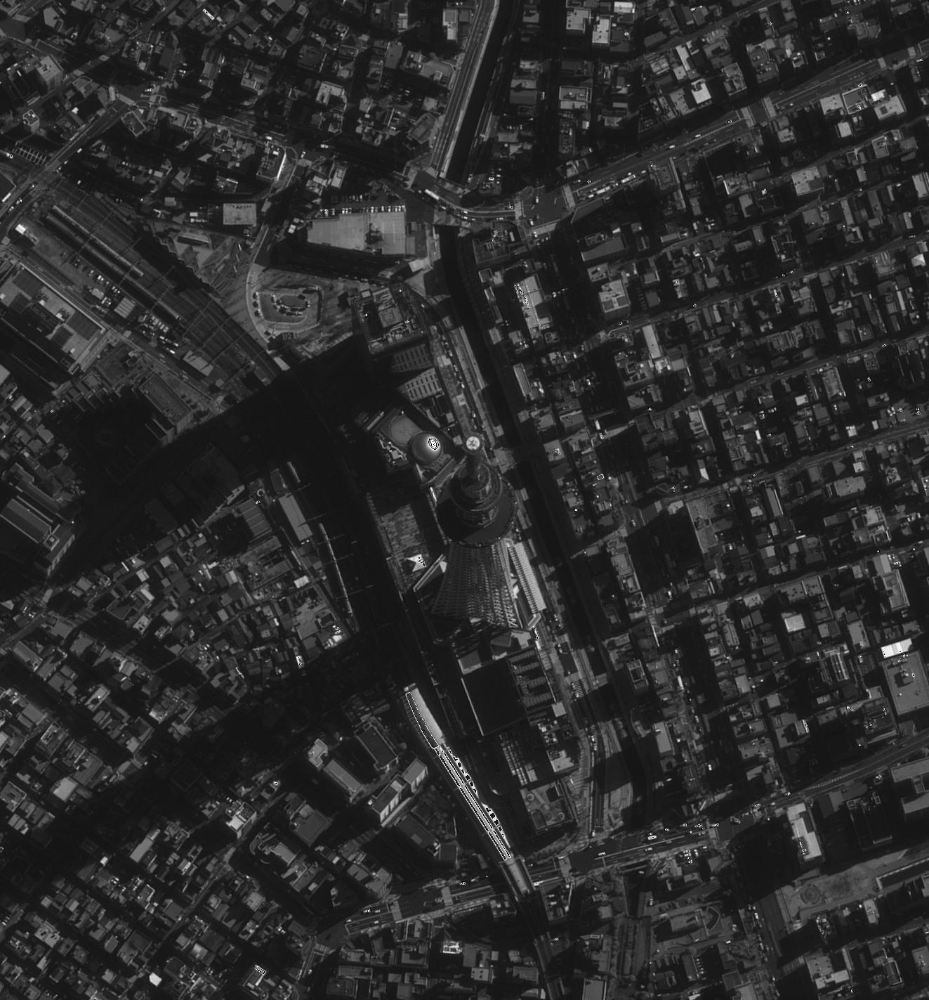
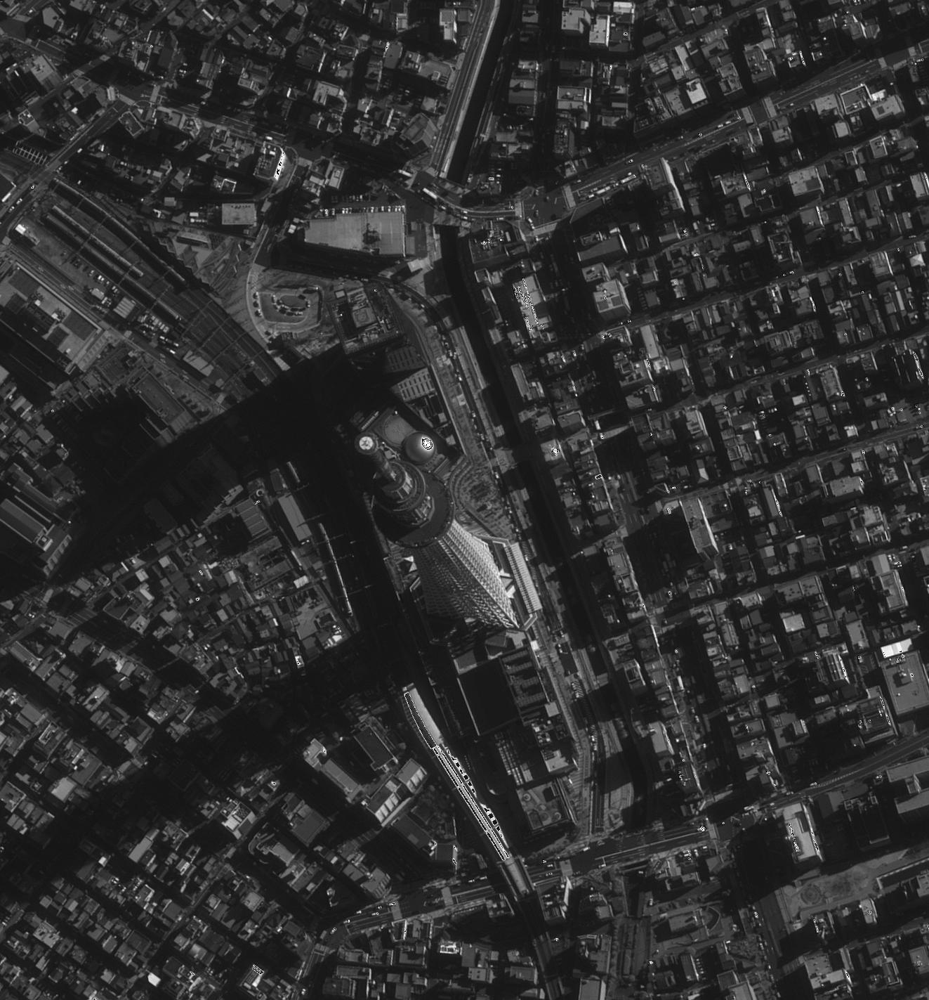

In [125]:
# show the rectified images
vistools.display_gallery([rect1/8,rect2/8])

Now that we have small, rectified images, we can feed them to any standard stereo matching algorithms to find a dense set of matches.  Here, we use the implementation of Semi Global Matching seen on TP4, with standard filtering options.

In [128]:
# compute a disparity map between two rectified images
LRS, _, _ = stereo.compute_disparity_map(rect1, rect2, 3*dmin, dmax )

t=3.7183 done building CV
t=8.9733 done sgmfilter
t=9.4559 done aggregation and WTA refinement
t=3.5073 done building CV
t=7.7593 done sgmfilter
t=8.2498 done aggregation and WTA refinement


<IPython.core.display.Javascript object>


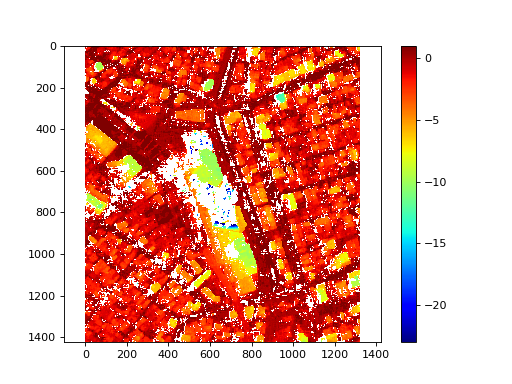

In [129]:
# display the resulting disparity map
vistools.display_imshow(LRS, cmap='jet')

**Exercice 5.** Compute a few disparity maps between a central image and other images in the sequence.  How does a high baseline affect the quality of the result? (in terms of precision of the matches and density of valid points).

**Answer.**  There is a compromise between density and precision.  A smaller baseline produces a denser disparity map (because the images are easier to match), however the matches will be less precise in 3D (because an error of 1 pixel has a much higher effect).  On the other hand, a large baseline will give very precise matches but on a much smaller set of valid points. 

**Exercice 6** Write a function that transforms a disparty map into 3D point cloud.  For that, you have to invert the rectifying transformations to go back to the coordinates of the original (uncropped) image domain, and then triangulate these correspondences.  If your tringulation function admits vectorial inputs, then this step can be be blazingly fast!

In [130]:
# code for exercice 6
def triangulate_disparities(dmap, rpc1, rpc2, S1, S2, PA, PB):
    """
    Triangulate a disparity map
    
    Arguments:
        dmap : a disparity map between two rectified images
        rpc1, rpc2 : calibration data of each image
        S1, S2 : rectifying affine maps (from the domain of the original, full-size images)
        PA, PB : the affine approximations of rpc1 and rpc2 (not always used)
        
    Return:
        xyz : a matrix of size Nx3 (where N is the number of finite disparites in dmap)
              this matrix contains the coordinates of the 3d points in "lon,lat,h" or "e,n,h"
    """
    
    # 1. unroll all the valid (finite) disparities of dmap into a vector
    m = np.isfinite(dmap.flatten())
    x = np.argwhere(np.isfinite(dmap))[:,1]    # attention to order of the indices
    y = np.argwhere(np.isfinite(dmap))[:,0]
    d = dmap.flatten()[m]
    
    # 2. for each disparity
    # 2.1. produce a pair of points in the original image domain by composing with S1 and S2
    p = np.linalg.inv(S1) @ np.vstack( (x+0, y, np.ones(len(d))) )
    q = np.linalg.inv(S2) @ np.vstack( (x+d, y, np.ones(len(d))) )
    # 2.2. triangulate the pair of image points to find a 3D point (in UTM coordinates)
    lon, lat, h, e = triangulation_affine(PA, PB, p[0,:], p[1,:], q[0,:], q[1,:])
    east, north = utils.utm_from_latlon(lat, lon)
    # 2.3. add this point to the output list
    xyz = np.vstack((east, north, h)).T
    
    # map of triangulation errors
    err = dmap.copy()
    err.flat[m] = e 
    return xyz, err

In [131]:
# triangulate the disparities of the previously computed case
xyz, err = triangulate_disparities(LRS, myrpcs[idx_a], myrpcs[idx_b], S1, S2, PA, PB)
xyz.shape

(1611389, 3)

In [132]:
# compute the UTM bounding box of the obtained 3D points
min_e, min_n = np.min(xyz,axis=0)[0:2]
max_e, max_n = np.max(xyz,axis=0)[0:2]

print((min_e, max_e, max_e-min_e))
print((min_n, max_n, max_n-min_n))

(392056.5886106505, 392927.45538132323, 870.8667706727283)
(3952023.566368794, 3952835.8387916796, 812.2724228855222)


Now, if all went well, you should be able to display a 3D point cloud using the `display_cloud` function below

In [133]:
# open the POTREE visualizer
vistools.display_cloud(xyz)

## Creation of a D.E.M.

Point clouds in 3D are beautiful, but in a geographical context it is often useful and easier to work with 2.5D models, called digital elevation models (DEM).  We can build a DEM by projecting a point cloud into a fixed square grid in UTM coordinates and accumulate into each square all the 3D points that fall into it.


**Exercice 7**  Write a function that projects a 3D point cloud into a DEM.  This function receives as input the desired resolution of the DEM.

In [134]:
from numba import jit

# this function accumulates all the 3D points into a 2.5D grid
# it computes the maximum height (or the average height, by a small change)
@jit
def reducemax( w,h,  ix, iy, z ):
    D_sum = -np.ones((h,w))*np.inf
    D_cnt = np.zeros((h,w))
    for t in range(len(ix)):
        ty = iy[t]
        tx = ix[t]
        D_sum[ty,tx] = max(D_sum[ty,tx], z[t])
        D_cnt[ty,tx] += 1         
#    D_sum /= D_cnt  # needed for computing average

    return D_sum 

def project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution=1):
    """
    Project a point cloud into an utm grid to produce a DEM
    The algorithm is the simplest possible: just average all the points that fall into each square of the grid.
    
    Arguments:
        xyz : a Nx3 matrix representing a point cloud in (lon,lat,h) coordinates
        emin,emax,nmin,nmax : a bounding box in UTM coordinates
        resolution : the target resolution in meters (by default, 1 meter)
        
    Return:
        dem : a 2D array of heights in meters
    """
    
    # width and height of the image domain
    w = int(np.ceil((emax - emin)/resolution))
    h = int(np.ceil((nmax - nmin)/resolution))
    
    # extract and quantize columns
    x = xyz[:,0]
    y = xyz[:,1]
    z = xyz[:,2]
    
    ix = np.asarray((x - emin)/resolution, dtype="int").clip(0,w)
    iy = np.asarray((nmax - y)/resolution, dtype="int").clip(0,h)
   
    dem = reducemax (w,h,  ix, iy, z )
        
    return dem

def dem_from_xyz(xyz, resolution=1):
    min_e, min_n = np.min(xyz,axis=0)[0:2] - resolution
    max_e, max_n = np.max(xyz,axis=0)[0:2] + resolution
    return project_cloud_into_utm_grid(xyz, min_e, max_e, min_n, max_n, resolution)

In [135]:
# compute the DEM from the 3D point cloud obtained above
dem = dem_from_xyz(xyz, resolution=1)

<IPython.core.display.Javascript object>


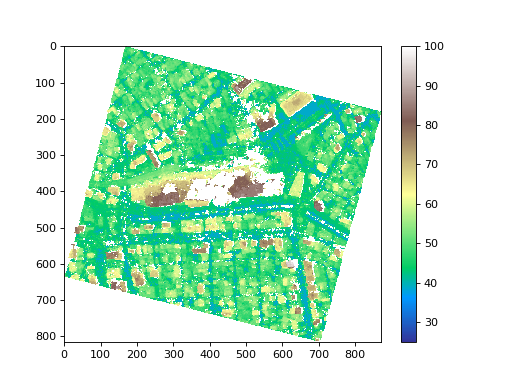

In [136]:
# visualize the DEM using a color palette
# see other palettes here: https://matplotlib.org/examples/color/colormaps_reference.html
vistools.display_imshow(dem, [25,100], cmap="terrain")

If you have reached this point, you have produced a high-resolution D.E.M. from a pair of satellite images.  This is no small feat!  You have repeated in a single day a program that took us many years!

## Multi-view stereo

Now let us see how can we merge the D.E.M. computed from several pairs of images.

In [137]:
# function that computes a D.E.M. from a pair of images
def dem_from_pair(img_a, img_b, aoi, resolution=1):
    
    # extract the RPC functions of each image
    rpc_a = utils.rpc_from_geotiff(img_a)
    rpc_b = utils.rpc_from_geotiff(img_b)
    
    # run the whole pipeline
    R1, R2, S1, S2, dmin, dmax, PA, PB = rectification.rectify_aoi(img_a, img_b, aoi)
    print(f"dmin,dmax = {dmin},{dmax}")
    LRS, _, _ = stereo.compute_disparity_map(R1, R2, dmin-10, dmax+10, cost="census")
    print(f"done computing disparity map")
    xyz, _ = triangulate_disparities(LRS, rpc_a, rpc_b, S1, S2, PA, PB)
    emin, emax, nmin, nmax = utils.utm_bounding_box_from_lonlat_aoi(aoi)
    dem = project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution)
    
    return dem

In [138]:
# compute DEM from images 11 and 12
dem1 = dem_from_pair(myimages[11], myimages[12], aoi_meji)

dmin,dmax = -7.480335604329594,0.7878772305804886
t=5.2728 done building CV
t=10.1967 done sgmfilter
t=10.7101 done aggregation and WTA refinement
t=4.0289 done building CV
t=9.0925 done sgmfilter
t=9.6188 done aggregation and WTA refinement
done computing disparity map


In [139]:
# compute DEM from images 12 and 13
dem2 = dem_from_pair(myimages[12], myimages[13], aoi_meji)

dmin,dmax = -7.383173169622296,1.288279470351607
t=3.8010 done building CV
t=8.2215 done sgmfilter
t=8.8186 done aggregation and WTA refinement
t=3.8088 done building CV
t=8.5394 done sgmfilter
t=9.0585 done aggregation and WTA refinement
done computing disparity map


In [140]:
# compute DEM from images 13 and 14
dem3 = dem_from_pair(myimages[13], myimages[14], aoi_meji)

dmin,dmax = -7.550854121319844,1.287444674020207
t=6.2560 done building CV
t=11.4457 done sgmfilter
t=12.0619 done aggregation and WTA refinement
t=4.1660 done building CV
t=10.1721 done sgmfilter
t=10.7965 done aggregation and WTA refinement
done computing disparity map


<IPython.core.display.Javascript object>


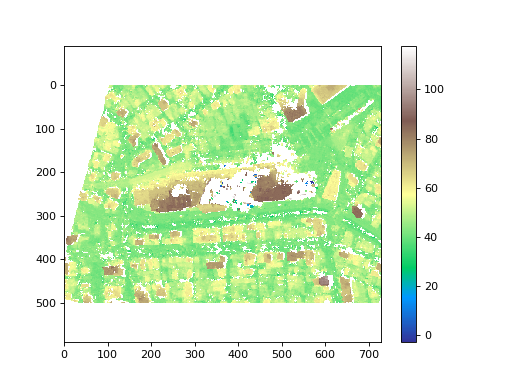

<IPython.core.display.Javascript object>


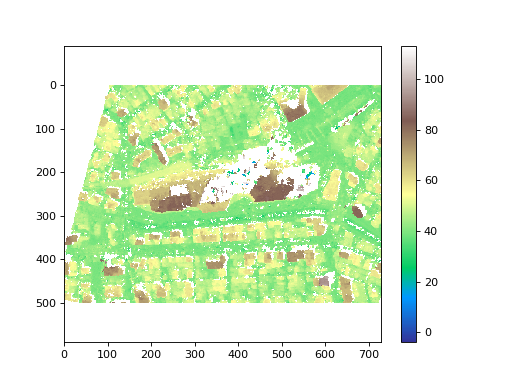

In [141]:
# visualize the computed DEMs
vistools.display_imshow(dem1,cmap="terrain")
vistools.display_imshow(dem2,cmap="terrain")

In [142]:
# compute the average of the three
dem123 = (dem1 + dem2 + dem3)/3


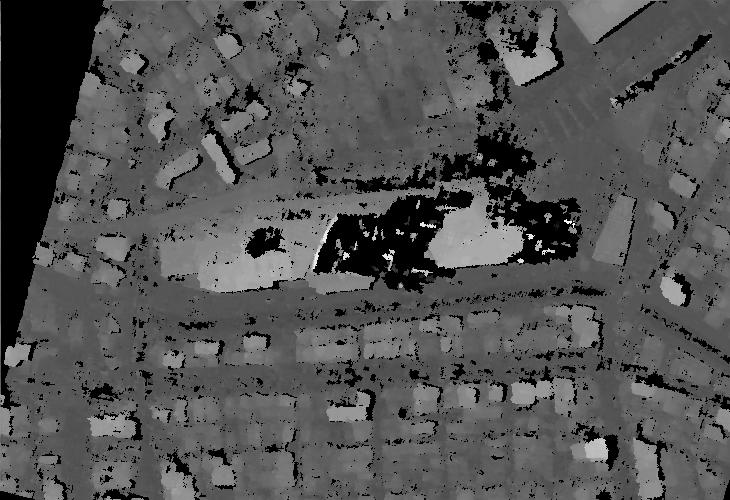
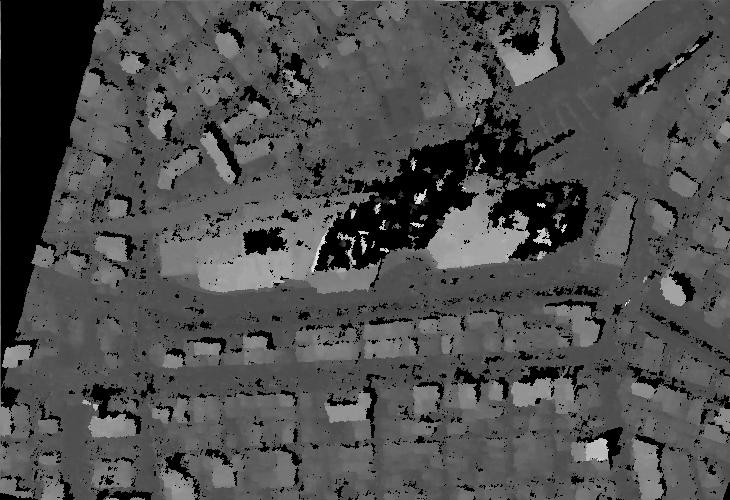
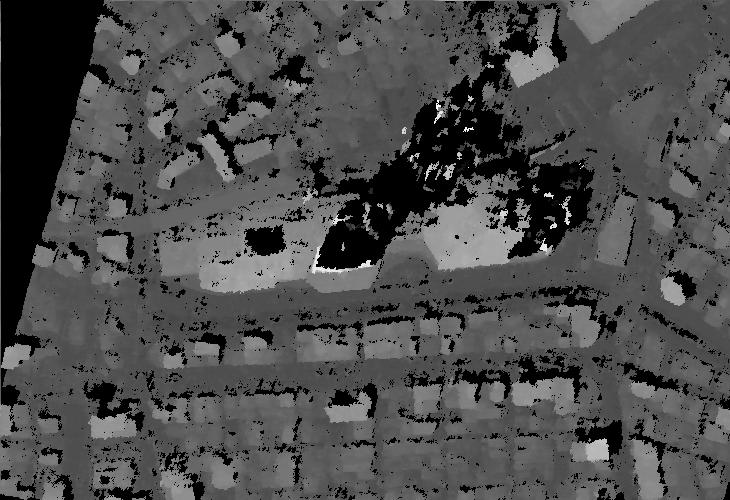
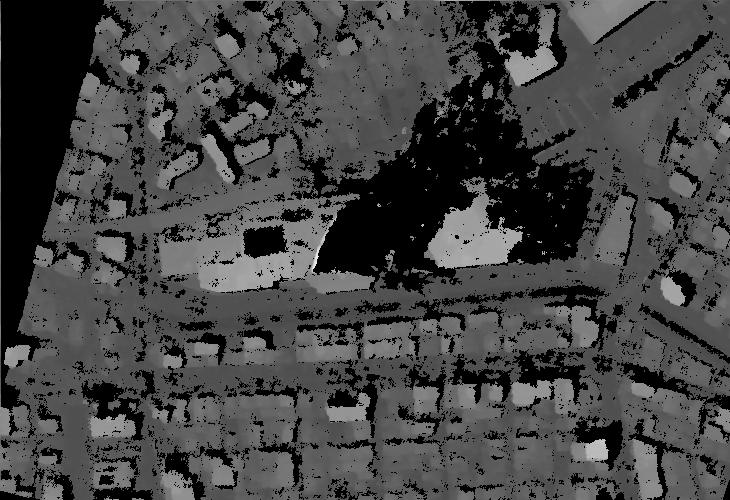

In [143]:
# view the three DEM and their average
vistools.display_gallery([2*dem1, 2*dem2, 2*dem3, 2*dem123])

Notice that the average of the three DEM is only computed at the points where all the three DEMs are defined.  Thus, by merging more and more images we will obtain less and less dense DEM.

**Question 2.** Write a function that merges several DEMs into a single one, by computing the average of the all the avaliable heights at each point.  Verify that by merging more and more images you obtain denser and denser DEMs.

In [158]:
def dem_fusion(dems):
    """
    Merge a list of several DEMs into a single one
    
    Arguments:
        dems: a list of 2D arrays of the same size
        
    Return:
        dem : a 2D array
    """
    out = np.zeros(dems[0].shape)
    def defined(x):
        return np.logical_not(np.isneginf(x))
    def remove_neginf(x):
        print(x)
        x[np.isneginf(x)==1]=0
        return x
    number_defined = sum(defined(d) for d in dems)
    total = np.sum(remove_neginf(d) for d in dems)
    out = np.divide(total, number_defined)
    out[np.isnan(out)] = -1.0 * np.inf
    return out
    
x = np.array([[1,2],[1,-1*np.inf]])
y = np.array([[-1.*np.inf,1], [1,-1*np.inf]])
print(dem_fusion([x,y]))
print(dem_fusion([dem1, dem2, dem3]))

[[  1.   2.]
 [  1. -inf]]
[[-inf   1.]
 [  1. -inf]]
[[ 1.   1.5]
 [ 1.  -inf]]
[[ 0.          0.          0.         ... 43.57748157 42.66124801 41.9922228 ]
 [42.0539153   0.          0.         ... 42.14363441 41.86960392 41.5331148 ]
 [45.28804855  0.          0.         ... 42.17814146 40.54765784 40.39574864]
 ...
 [ 0.          0.          0.         ...  0.          0.          0.        ]
 [ 0.          0.          0.         ...  0.          0.          0.        ]
 [ 0.          0.          0.         ...  0.          0.          0.        ]]
[[ 0.          0.          0.         ... 41.23749305 40.31416961 40.35931121]
 [40.70601006  0.          0.         ... 40.40722384 39.27911063 39.37248017]
 [41.40342522  0.          0.         ... 40.45840459 39.40066538 39.40066538]
 ...
 [ 0.          0.          0.         ...  0.          0.          0.        ]
 [ 0.          0.          0.         ...  0.          0.          0.        ]
 [ 0.          0.          0.         .

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide


**Question 3. (BONUS)**  Write a function that "elevates" a DEM into a 3D point cloud, and visualize the result of your dem_fusion as a 3D point cloud.

In [180]:
def dem_elevate_to_3d(dem, emin, emax, nmin, nmax):
    """
    Elevate a DEM in UTM coordinates into a 3D point cloud
    
    Arguments:
        dem: a 2D array representing a DEM
        emin,emax,nmin,mnax: the corresponding UTM bounding box
        
    Return:
        xyz : a 2D array of size Nx3, representing a 3D point cloud
    """
    N,E = dem.shape
    Ns = np.linspace(nmin, nmax, N)
    Es = np.linspace(emin, emax, E)
    print(N*E)
    number_points = np.sum(np.isneginf(dem) == 0)
    print(number_points)
    cloud = np.zeros((number_points,3))
    print(cloud.shape)
    ctr = 0
    for n in range(N):
        Nval = Ns[n]
        for e in range(E):
            Eval = Es[e]
            if not np.isneginf(dem[n,e]):
                cloud[ctr, :] = (Eval,Nval,dem[n,e])
                ctr += 1
    return cloud
                
    # WRITE THE CODE OF QUESTION 3 HERE

In [181]:
# OPTIONAL: test the "elevation" code
emin, emax, nmin, nmax = utils.utm_bounding_box_from_lonlat_aoi(aoi_meji)
print(emin, emax, nmin, nmax)
cloud = dem_elevate_to_3d(dem123, emin, emax, nmin, nmax)

392079.99404523673 392809.7417898118 3952187.038851532 3952686.1648090756
365000
256081
(256081, 3)


In [182]:
# visualize the computed cloud using the POTREE viewer
vistools.display_cloud(cloud)